In [1]:
import numpy as np
from matplotlib import colors
from Configuration import *
import os

In [2]:
from climada.entity import Entity
from climada.entity import Exposures
from pandas import DataFrame
from climada.entity.exposures import LitPop

['British Columbia', 'Alberta', 'Saskatchewan', 'Manitoba', 'Ontario', 'Québec', 'New Brunswick', 'Yukon', 'Nunavut', 'Newfoundland and Labrador', 'Nova Scotia', 'Northwest Territories', 'Prince Edward Island']
Nova Scotia index: 10

 Runtime `from_shape` : 17.48 sec.



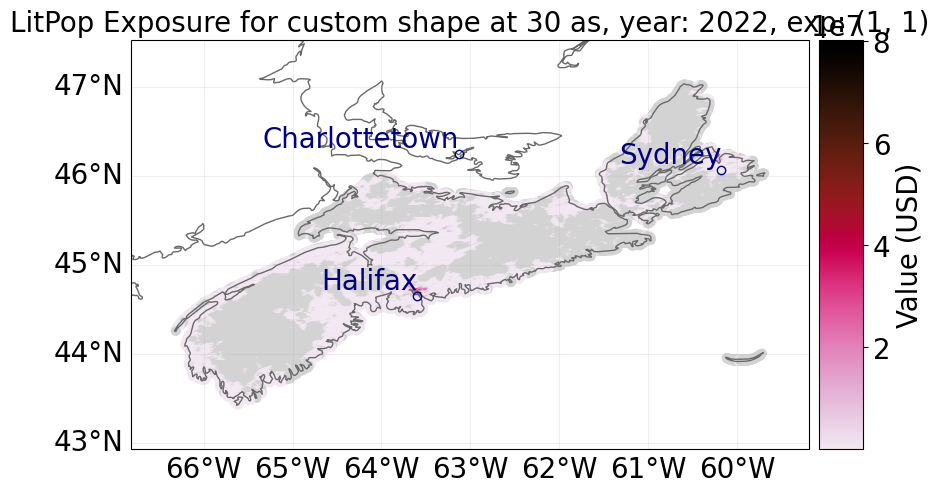

In [3]:
import time
import climada.util.coordinates as u_coord
import climada.entity.exposures.litpop as lp

country_iso3a = 'CAN'
state_name = 'Nova Scotia'
reslution_arcsec = 200
"""First, we need to get the shape of Nova Scotia:"""
admin1_info, admin1_shapes = u_coord.get_admin1_info(country_iso3a)
admin1_info = admin1_info[country_iso3a]
admin1_shapes = admin1_shapes[country_iso3a]
admin1_names = [record['name'] for record in admin1_info]
print(admin1_names)
for idx, name in enumerate(admin1_names):
    if admin1_names[idx]==state_name:
        break
print('Nova Scotia index: ' + str(idx))

"""Secondly, we estimate the `total_value`"""
# `total_value` required user input for `from_shape`, here we assume 2.01% of total value of the whole CAN, and 12,97% of total GDP:
total_value = 0.0201 * 0.1297 * lp._get_total_value_per_country(country_iso3a, 'gdp', 2022)

"""Then, we can initiate the exposures for Nova Scotia:"""
start = time.process_time()
exp_building = LitPop.from_shape(admin1_shapes[idx], total_value, res_arcsec=30, reference_year=2022)
print(f'\n Runtime `from_shape` : {time.process_time() - start:1.2f} sec.\n')
exp_building.plot_scatter(vmin=100, buffer=.5);

In [ ]:
#Plot_raster method
from climada.util.plot import add_cntry_names
ax = exp_building.plot_raster(); # plot with same resolution as data
add_cntry_names(ax, [exp_building.gdf.longitude.min(), exp_building.gdf.longitude.max(), exp_building.gdf.latitude.min(), exp_building.gdf.latitude.max()])

results = CONFIG.local_data.save_dir.dir()
save_tiff='building.tiff'

<GeoAxesSubplot:title={'center':'LitPop Exposure for custom shape at 30 as, year: 2022, exp: (1, 1)'}>

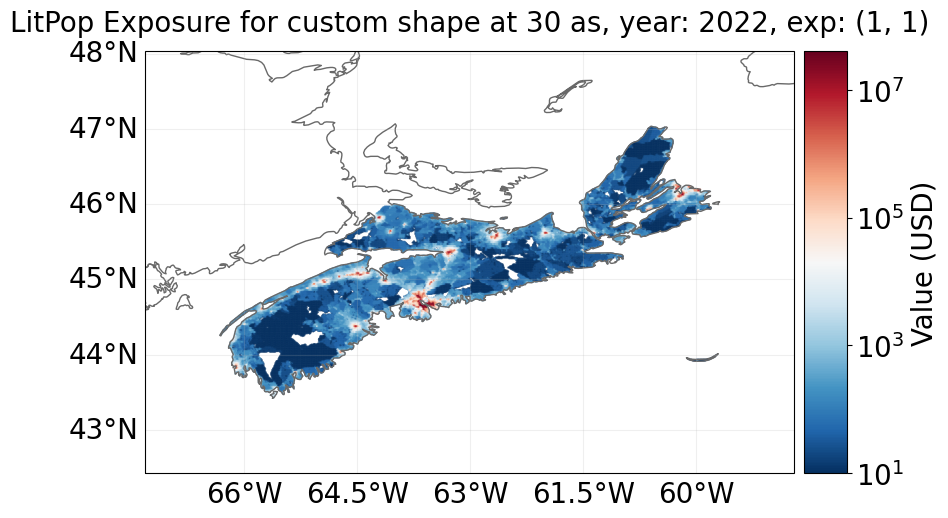

In [5]:
#Plot Exposure Map
norm = colors.LogNorm(vmin=10, vmax=4.0e7)

exp_building.plot_hexbin(norm=norm, pop_name=False, cmap='RdBu_r', buffer=1)

In [ ]:
### Calculates the distance to the nearest cell with a specific state (shoreline)
### Input: discrete raster of categories (e.g. 1 = shoreline, 0 = no no shoreline)
### Sets evidence on node continuous node (Distance_shoreline)

# import packages
import os
import sys
import numpy
from osgeo.gdalconst import *
from osgeo import gdal
import math
from node_utils import *
from scipy.spatial import distance

# set names for labelling the script while running
SCRIPT_NAME = "CONT_DISTANCE: "  # to add as a prefix for all messages
CELLS_PRINTING = 10

# SET FUNCTION PARAMETERS
# name of input node
input_name = "shoreline"
# number of the state in the input raster that defines the cells (e.g. shoreline), the distance to which we are interested in
state_number = 0;
# name of output node
output_name = "Distance_shoreline"


# function that finds cells of interest
def isShoreline(node, cell):
    return (getStateHighestLikelihood(node, cell) == state_number)

# function that finds distance to the nearest cell of interest
def findCloserShoreCell(cell, shore_list, width):

    if (len(shore_list) == 0):
        print("findCloserShoreCell: There are no shoreline in the map.")
        return None

    return min(distance.cdist([cell], shore_list, 'euclidean')[0])

# function that writes distance to the output node
def process(dataset,nodes_data,iteration):

     # only use it at the beginning
    if (iteration != -1):
        return []

    node_shoreline = getNodeByName(nodes_data, input_name)
    if (not node_shoreline):
        print(SCRIPT_NAME, "ERROR Node", input_name, "is not in nodes_data")
        return []

    total_cells = dataset.RasterXSize * dataset.RasterYSize ;

    # get pixel size
    pixelsize = dataset.GetGeoTransform()[1]

    print(SCRIPT_NAME, "pixelsize:", pixelsize)

    shoreline_cells = [];

    for cell in range(total_cells ):

        if (isShoreline(node_shoreline,cell)):
            shoreline_cells.append(cell);

    print(SCRIPT_NAME, "There are", len(shoreline_cells), "cells that are shoreline")

    distances=[]

    # Transform to 2-dimensional array
    shoreline_coords = list(map(lambda x: [x / dataset.RasterXSize, x % dataset.RasterXSize], shoreline_cells))

    # append distances to new array
    for cell in range(total_cells ):

        if (isNODATA(node_shoreline, cell)):
            distances.append(PY_NODATA_VALUE)
        elif isShoreline(node_shoreline, cell):
            distances.append(0)
        else:
            distances.append(findCloserShoreCell([cell / dataset.RasterXSize, cell % dataset.RasterXSize], shoreline_coords, dataset.RasterXSize) * pixelsize)


    new_nodes_data = [{'name' : output_name, 'type': PY_CONTINUOUS, 'data': distances}]


    for i in range(CELLS_PRINTING):
        print(SCRIPT_NAME, "cell:", i, ":" ,  new_nodes_data[0]['data'][i])


    if (validResultData(new_nodes_data, total_cells)):
        return new_nodes_data

    else:
        print ("Some error here: ")

In [11]:
#Construct Impact Locale

# reload required modules
import shapely
from climada_petals.entity.exposures.openstreetmap.osm_dataloader import OSMApiQuery
from climada import CONFIG

DATA_DIR = CONFIG.exposures.openstreetmap.local_data.dir()

In [12]:
## Area for geoBN
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349), (-63.6028295, 44.6894002)])

# Two examples for query conditions:
#condition_admin = '["admin_level"]'
condition_builidng = '["building"]'

# Initialize OSMApiQuery instances
ns_building_polygbay = OSMApiQuery(area_poly, condition_builidng)

In [13]:
## Area for geoBN
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349), (-63.6028295, 44.6894002)])

# Two examples for query conditions:
#condition_admin = '["admin_level"]'
condition_voltage = '["voltage"]'

# Initialize OSMApiQuery instances
ns_voltage_polygbay = OSMApiQuery(area_poly, condition_voltage)

In [14]:
## Area for geoBN
# Two area-formats that are accepted: a bounding box tuple or list (xmin, ymin, xmax, ymax) and polygons
area_bbox = (-63.85527, 44.04342, -63.40262, 44.88577)
area_poly = shapely.geometry.Polygon([(-63.569264, 44.642156), (-63.521377, 44.656487), (-63.554452, 44.705349), (-63.6028295, 44.6894002)])

# Two examples for query conditions:
#condition_admin = '["admin_level"]'
condition_highway = '[highway~"^(primary|secondary|tertiary)$"]'

# Initialize OSMApiQuery instances
ns_highway_polygbay = OSMApiQuery(area_poly, condition_highway)

In [15]:
gdf_ns_buildinggbay = ns_building_polygbay.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:710: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_rels)
c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)
c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:722: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results =  gdf_results.append(gdf_nodes)


In [16]:
gdf_ns_voltagegbay = ns_voltage_polygbay.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)


In [17]:
gdf_ns_highwaygbay = ns_highway_polygbay.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)


In [111]:
gdf_ns_building = ns_building_poly.get_data_overpass()

c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:710: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_rels)
c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:717: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results = gdf_results.append(gdf_ways)
c:\users\pln\climada_workspace2\climada_petals\climada_petals\entity\exposures\openstreetmap\osm_dataloader.py:722: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  gdf_results =  gdf_results.append(gdf_nodes)


In [18]:
gdf_ns_buildinggbay

,osm_id,geometry,tags
0,6788084,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
1,6821008,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...","{'addr:city': 'Dartmouth', 'addr:postcode': 'B..."
2,6844632,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
3,6846004,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
4,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
...,...,...,...
11137,1184377999,"POLYGON ((-63.55379 44.70196, -63.55382 44.701...",{'building': 'yes'}
11138,1189249682,"POLYGON ((-63.59256 44.69162, -63.59213 44.691...","{'addr:city': 'Dartmouth', 'addr:district': '6..."
11139,1194725392,"POLYGON ((-63.56899 44.64301, -63.56853 44.643...","{'building': 'yes', 'name': 'CUNARD'}"
11140,1197154503,"POLYGON ((-63.59088 44.67634, -63.59088 44.676...",{'building': 'yes'}


In [19]:
gdf_ns_voltagegbay

,osm_id,geometry,tags
0,82329702,"LINESTRING (-63.52504 44.65533, -63.52539 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No..."
1,83327265,"LINESTRING (-63.59448 44.67757, -63.59671 44.6...","{'cables': '6', 'circuits': '2', 'frequency': ..."
2,84172082,"POLYGON ((-63.59450 44.67639, -63.59435 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
3,84174998,"POLYGON ((-63.58997 44.67626, -63.58947 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':..."
4,364023292,"LINESTRING (-63.52093 44.68183, -63.52120 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No..."
...,...,...,...
604,1189249034,"LINESTRING (-63.59241 44.69218, -63.59208 44.6...","{'cables': '3', 'communication': 'line', 'freq..."
605,1189249035,"LINESTRING (-63.59284 44.68766, -63.59462 44.6...","{'cables': '9', 'frequency': '60', 'operator':..."
606,1189249036,"LINESTRING (-63.58998 44.68275, -63.59144 44.6...","{'cables': '6', 'frequency': '60', 'operator':..."
607,1189252482,"LINESTRING (-63.58819 44.69261, -63.58795 44.6...","{'cables': '3', 'communication': 'line', 'freq..."


In [20]:
gdf_ns_highwaygbay

,osm_id,geometry,tags
0,3217710,"LINESTRING (-63.57765 44.65264, -63.57758 44.6...","{'clopin:id': 'cycleslow', 'clopin:route': 'cy..."
1,3494673,"LINESTRING (-63.57355 44.66728, -63.57324 44.6...",{'destination:backward': 'Windmill Road|Wyse R...
2,3494675,"LINESTRING (-63.55937 44.66814, -63.55861 44.6...",{'description': 'https://en.wikipedia.org/wiki...
3,4114478,"LINESTRING (-63.56615 44.67141, -63.56594 44.6...",{'description': 'https://en.wikipedia.org/wiki...
4,4114480,"LINESTRING (-63.56400 44.67080, -63.56402 44.6...","{'highway': 'tertiary', 'lane_markings': 'yes'..."
...,...,...,...
462,1198076971,"LINESTRING (-63.56044 44.66852, -63.56007 44.6...",{'description': 'https://en.wikipedia.org/wiki...
463,1198812569,"LINESTRING (-63.53720 44.65768, -63.53718 44.6...","{'highway': 'tertiary', 'lanes': '2', 'lit': '..."
464,1199317797,"LINESTRING (-63.58125 44.67207, -63.58110 44.6...","{'bicycle:lanes:backward': 'yes|designated', '..."
465,1199317798,"LINESTRING (-63.58175 44.67237, -63.58156 44.6...","{'bicycle:lanes:backward': 'yes|designated', '..."


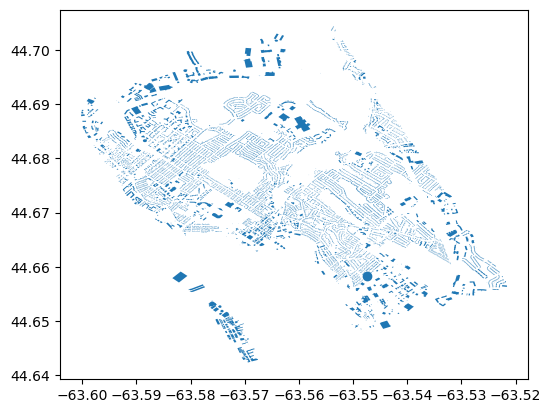

In [21]:
gdf_ns_buildinggbay.plot();

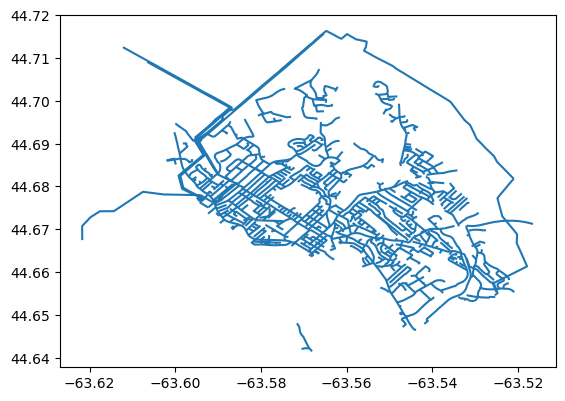

In [22]:
gdf_ns_voltagegbay.plot();

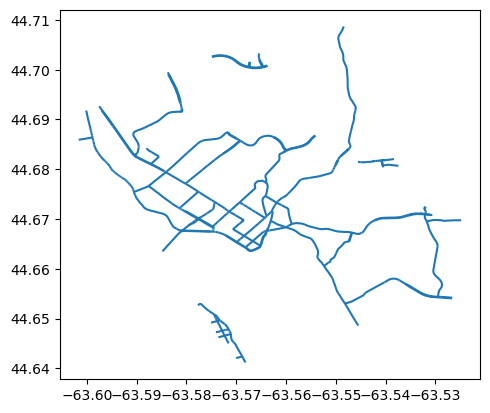

In [23]:
gdf_ns_highwaygbay.plot();

In [46]:
# Imports
import geopandas as gpd
import pandas as pd
from pathlib import Path
from climada.entity import Exposures
from climada.entity.impact_funcs import ImpactFuncSet
from climada.engine import ImpactCalc
import climada.util.lines_polys_handler as u_lp
from climada.util.constants import DEMO_DIR, WS_DEMO_NC

In [24]:
def gdf_poly():
    gdf_polys = gpd.GeoDataFrame(gdf_ns_buildinggbay)
    gdf_polys = gdf_polys.set_crs(epsg=4326)
    return gdf_polys

In [25]:
def gdf_poly2():
    gdf_polys2 = gpd.GeoDataFrame(gdf_ns_voltagegbay)
    gdf_polys2 = gdf_polys2.set_crs(epsg=4326)
    return gdf_polys2

In [26]:
def gdf_poly3():
    gdf_polys3 = gpd.GeoDataFrame(gdf_ns_highwaygbay)
    gdf_polys3 = gdf_polys3.set_crs(epsg=4326)
    return gdf_polys3

In [107]:
#def gdf_poly():
    gdf_polys = gpd.GeoDataFrame(gdf_ns_building)
    gdf_polys = gdf_polys.set_crs(epsg=4326)
    return gdf_polys

In [27]:
exp_polygbay = Exposures(gdf_poly())
exp_polygbay.gdf['impf_'] = 1
exp_polygbay.gdf.head()

,osm_id,geometry,tags,impf_
0,6788084,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
1,6821008,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...","{'addr:city': 'Dartmouth', 'addr:postcode': 'B...",1
2,6844632,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
3,6846004,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
4,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1


In [28]:
exp_polygbay2 = Exposures(gdf_poly2())
exp_polygbay2.gdf['impf_'] = 1
exp_polygbay2.gdf.head()

,osm_id,geometry,tags,impf_
0,82329702,"LINESTRING (-63.52504 44.65533, -63.52539 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No...",1
1,83327265,"LINESTRING (-63.59448 44.67757, -63.59671 44.6...","{'cables': '6', 'circuits': '2', 'frequency': ...",1
2,84172082,"POLYGON ((-63.59450 44.67639, -63.59435 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
3,84174998,"POLYGON ((-63.58997 44.67626, -63.58947 44.676...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
4,364023292,"LINESTRING (-63.52093 44.68183, -63.52120 44.6...","{'cables': '3', 'frequency': '60', 'name': 'No...",1


In [29]:
exp_polygbay3 = Exposures(gdf_poly3())
exp_polygbay3.gdf['impf_'] = 1
exp_polygbay3.gdf.head()

,osm_id,geometry,tags,impf_
0,3217710,"LINESTRING (-63.57765 44.65264, -63.57758 44.6...","{'clopin:id': 'cycleslow', 'clopin:route': 'cy...",1
1,3494673,"LINESTRING (-63.57355 44.66728, -63.57324 44.6...",{'destination:backward': 'Windmill Road|Wyse R...,1
2,3494675,"LINESTRING (-63.55937 44.66814, -63.55861 44.6...",{'description': 'https://en.wikipedia.org/wiki...,1
3,4114478,"LINESTRING (-63.56615 44.67141, -63.56594 44.6...",{'description': 'https://en.wikipedia.org/wiki...,1
4,4114480,"LINESTRING (-63.56400 44.67080, -63.56402 44.6...","{'highway': 'tertiary', 'lane_markings': 'yes'...",1


In [32]:
#exp_poly = Exposures(gdf_poly())
#exp_poly.gdf['impf_'] = 1
#exp_poly.gdf.head()

,osm_id,geometry,tags,impf_
0,6788084,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
1,6821008,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...","{'addr:city': 'Dartmouth', 'addr:postcode': 'B...",1
2,6844632,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
3,6846004,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1
4,7426186,"POLYGON ((-63.54254 44.66607, -63.54227 44.665...","{'addr:city': 'Dartmouth', 'addr:housenumber':...",1


In [30]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pntgbay = u_lp.exp_geom_to_pnt(
    exp_polygbay, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=1640)
exp_pntgbay.gdf.head()

2023-08-22 14:31:02,319 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,326 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,332 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,338 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,345 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,356 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,367 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 14:31:02,374 - climada.util.lines_pol

C:\Users\PLN\anaconda3\envs\climada_env\lib\site-packages\pandas\core\dtypes\inference.py:388: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
C:\Users\PLN\anaconda3\envs\climada_env\lib\site-packages\pandas\core\dtypes\inference.py:389: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
C:\Users\PLN\anaconda3\envs\climada_env\lib\site-packages\pandas\core\dtypes\cast.py:128: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


,,osm_id,geometry,tags,impf_,value,geometry_orig,latitude,longitude
11141,0.0,8996740170,POINT (-63.54734 44.65831),"{'addr:city': 'Dartmouth', 'addr:district': '5...",1,371000,POINT (-63.54734 44.65831),44.658315,-63.547345
0,0.0,6788084,POINT (-63.57977 44.67578),"{'addr:city': 'Dartmouth', 'addr:housenumber':...",1,371000,"POLYGON ((-63.57988 44.67576, -63.57976 44.675...",44.675780,-63.579773
1,0.0,6821008,POINT (-63.57089 44.68230),"{'addr:city': 'Dartmouth', 'addr:postcode': 'B...",1,371000,"POLYGON ((-63.57078 44.68233, -63.57091 44.682...",44.682301,-63.570892
2,0.0,6844632,POINT (-63.59200 44.67984),"{'addr:city': 'Dartmouth', 'addr:housenumber':...",1,371000,"POLYGON ((-63.59195 44.67977, -63.59190 44.679...",44.679837,-63.591995
3,0.0,6846004,POINT (-63.56805 44.66717),"{'addr:city': 'Dartmouth', 'addr:housenumber':...",1,371000,"POLYGON ((-63.56807 44.66722, -63.56798 44.667...",44.667171,-63.568051


In [ ]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pnt3 = u_lp.exp_geom_to_pnt(
    exp_poly, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=3692)
exp_pnt3.gdf.head()

2023-08-22 13:11:01,597 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,602 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,606 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,610 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,614 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,618 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,624 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 13:11:01,630 - climada.util.lines_pol

In [65]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pntgbay2 = u_lp.exp_geom_to_pnt(
    exp_polygbay2, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=330)
exp_pntgbay2.gdf.head()

2023-08-22 16:49:29,841 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 16:49:29,856 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 16:49:29,864 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 16:49:29,876 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.
2023-08-22 16:49:29,889 - climada.util.lines_polys_handler - WARNING - Polygon smaller than resolution. Setting a representative point.


osm_id                                      geometry_orig  \
0 0  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  1  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  2  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  3  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   
  4  82329702  LINESTRING (-63.52504 44.65533, -63.52539 44.6...   

                                                  tags  impf_   value  \
0 0  {'cables': '3', 'frequency': '60', 'name': 'No...      1  101000   
  1  {'cables': '3', 'frequency': '60', 'name': 'No...      1  101000   
  2  {'cables': '3', 'frequency': '60', 'name': 'No...      1  101000   
  3  {'cables': '3', 'frequency': '60', 'name': 'No...      1  101000   
  4  {'cables': '3', 'frequency': '60', 'name': 'No...      1  101000   

                       geometry   latitude  longitude  
0 0  POINT (-63.52504 44.65533)  44.655329 -63.525036  
  1  POINT (-63.51999 44.66025)  44.660246 -63.519994  
  2  POINT (-63.52028 44.66715)  44.667146 -63.520279  
  3  POINT (-63.52407 44.67457)  44.674571 -63.524073  
  4  POINT (-63.52091 44.68174)  44.681740 -63.520906

In [52]:
# Disaggregate exposure to 1'00 metre grid, each point gets value corresponding to
# its representative area (10^2).
exp_pntgbay3 = u_lp.exp_geom_to_pnt(
    exp_polygbay3, res=1000, to_meters=True,
    disagg_met=u_lp.DisaggMethod.FIX, disagg_val=3692)
exp_pntgbay3.gdf.head()

osm_id                                      geometry_orig  \
0 0  3217710  LINESTRING (-63.57765 44.65264, -63.57758 44.6...   
  1  3217710  LINESTRING (-63.57765 44.65264, -63.57758 44.6...   
1 0  3494673  LINESTRING (-63.57355 44.66728, -63.57324 44.6...   
  1  3494673  LINESTRING (-63.57355 44.66728, -63.57324 44.6...   
2 0  3494675  LINESTRING (-63.55937 44.66814, -63.55861 44.6...   

                                                  tags  impf_   value  \
0 0  {'clopin:id': 'cycleslow', 'clopin:route': 'cy...      1  371000   
  1  {'clopin:id': 'cycleslow', 'clopin:route': 'cy...      1  371000   
1 0  {'destination:backward': 'Windmill Road|Wyse R...      1  371000   
  1  {'destination:backward': 'Windmill Road|Wyse R...      1  371000   
2 0  {'description': 'https://en.wikipedia.org/wiki...      1  371000   

                       geometry   latitude  longitude  
0 0  POINT (-63.57765 44.65264)  44.652640 -63.577654  
  1  POINT (-63.57546 44.65153)  44.651531 -63.575462  
1 0  POINT (-63.57355 44.66728)  44.667285 -63.573549  
  1  POINT (-63.57208 44.66671)  44.666708 -63.572080  
2 0  POINT (-63.55937 44.66814)  44.668135 -63.559375

In [47]:
# Point-impactGBAY
imp_pntgbay = ImpactCalc(exp_pntgbay, IFs_TC_building, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay = u_lp.impact_pnt_agg(imp_pntgbay, exp_pntgbay.gdf, agg_met=u_lp.AggMethod.SUM)

In [48]:
# Point-impactGBAY
imp_pntgbay45 = ImpactCalc(exp_pntgbay, IFs_TC_building, hazard=HAZ_tc_cc45).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay45 = u_lp.impact_pnt_agg(imp_pntgbay45, exp_pntgbay.gdf, agg_met=u_lp.AggMethod.SUM)

In [49]:
# Point-impactGBAY
imp_pntgbay85 = ImpactCalc(exp_pntgbay, IFs_TC_building, hazard=HAZ_tc_cc85).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay85 = u_lp.impact_pnt_agg(imp_pntgbay85, exp_pntgbay.gdf, agg_met=u_lp.AggMethod.SUM)

In [66]:
# Point-impactGBAY
imp_pntgbay2 = ImpactCalc(exp_pntgbay2, IFs_TC_voltage, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay2 = u_lp.impact_pnt_agg(imp_pntgbay2, exp_pntgbay2.gdf, agg_met=u_lp.AggMethod.SUM)

In [67]:
# Point-impactGBAY
imp_pntgbay245 = ImpactCalc(exp_pntgbay2, IFs_TC_voltage, hazard=HAZ_tc_cc45).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay245 = u_lp.impact_pnt_agg(imp_pntgbay245, exp_pntgbay2.gdf, agg_met=u_lp.AggMethod.SUM)

In [68]:
# Point-impactGBAY
imp_pntgbay285 = ImpactCalc(exp_pntgbay2, IFs_TC_voltage, hazard=HAZ_tc_cc85).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay285 = u_lp.impact_pnt_agg(imp_pntgbay285, exp_pntgbay2.gdf, agg_met=u_lp.AggMethod.SUM)

In [56]:
# Point-impactGBAY
imp_pntgbay3 = ImpactCalc(exp_pntgbay3, IFs_TC_road, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay3 = u_lp.impact_pnt_agg(imp_pntgbay3, exp_pntgbay3.gdf, agg_met=u_lp.AggMethod.SUM)

In [57]:
# Point-impactGBAY
imp_pntgbay345 = ImpactCalc(exp_pntgbay3, IFs_TC_road, hazard=HAZ_tc_cc45).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay345 = u_lp.impact_pnt_agg(imp_pntgbay345, exp_pntgbay3.gdf, agg_met=u_lp.AggMethod.SUM)

In [58]:
# Point-impactGBAY
imp_pntgbay385 = ImpactCalc(exp_pntgbay3, IFs_TC_road, hazard=HAZ_tc_cc85).impact(save_mat=True)

# Aggregated impact (Note that you need to pass the gdf)
imp_geomgbay385 = u_lp.impact_pnt_agg(imp_pntgbay385, exp_pntgbay3.gdf, agg_met=u_lp.AggMethod.SUM)

In [77]:
# Point-impact
imp_pnt = ImpactCalc(exp_pnt3, IFs_TC_building, hazard=tc_ns).impact(save_mat=True)

# Aggregated impact (Note that you need to pass)
imp_geom = u_lp.impact_pnt_agg(imp_pnt, exp_pnt3.gdf, agg_met=u_lp.AggMethod.SUM)

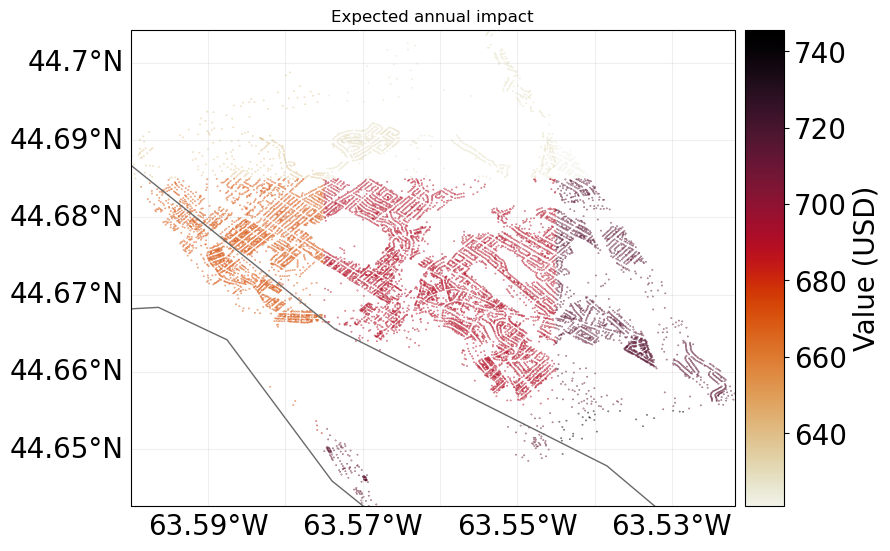

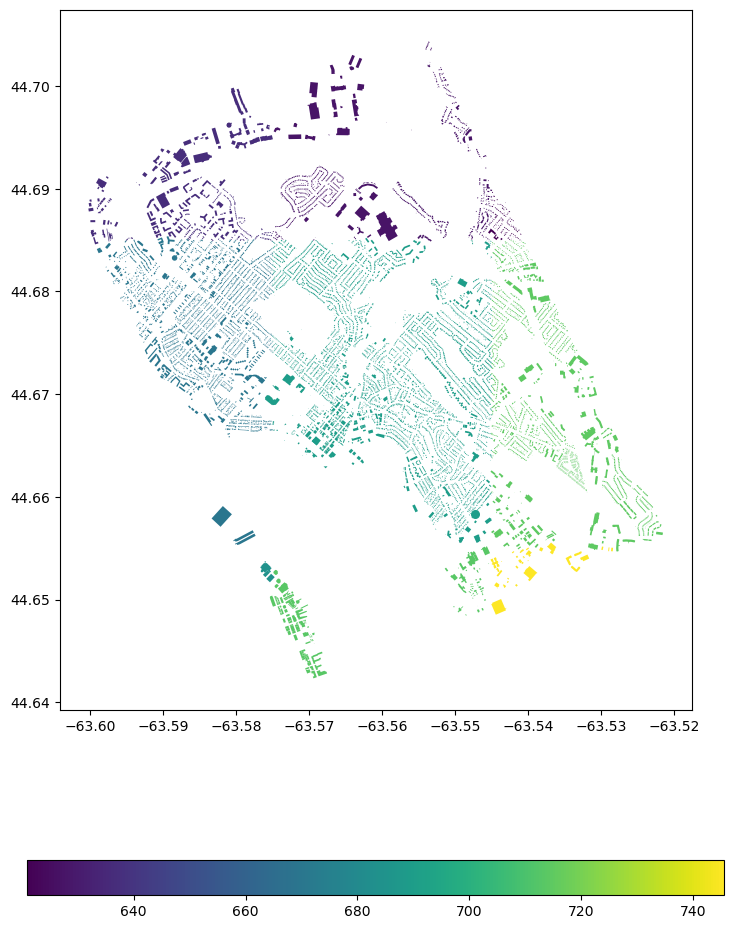

In [50]:
# Plot point-impacts and aggregated impacts
imp_pntgbay.plot_hexbin_eai_exposure(adapt_fontsize=True);
u_lp.plot_eai_exp_geom(imp_geomgbay, legend_kwds={'orientation': 'horizontal'}, markersize=30);

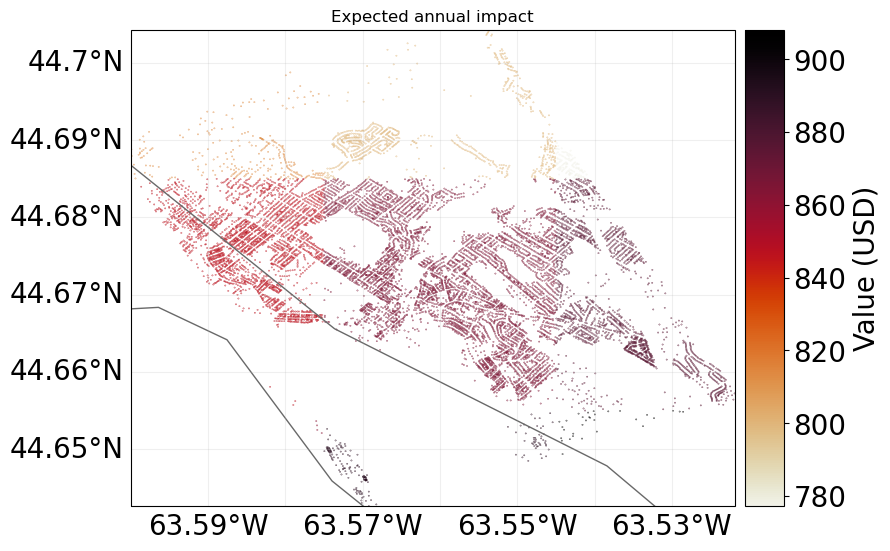

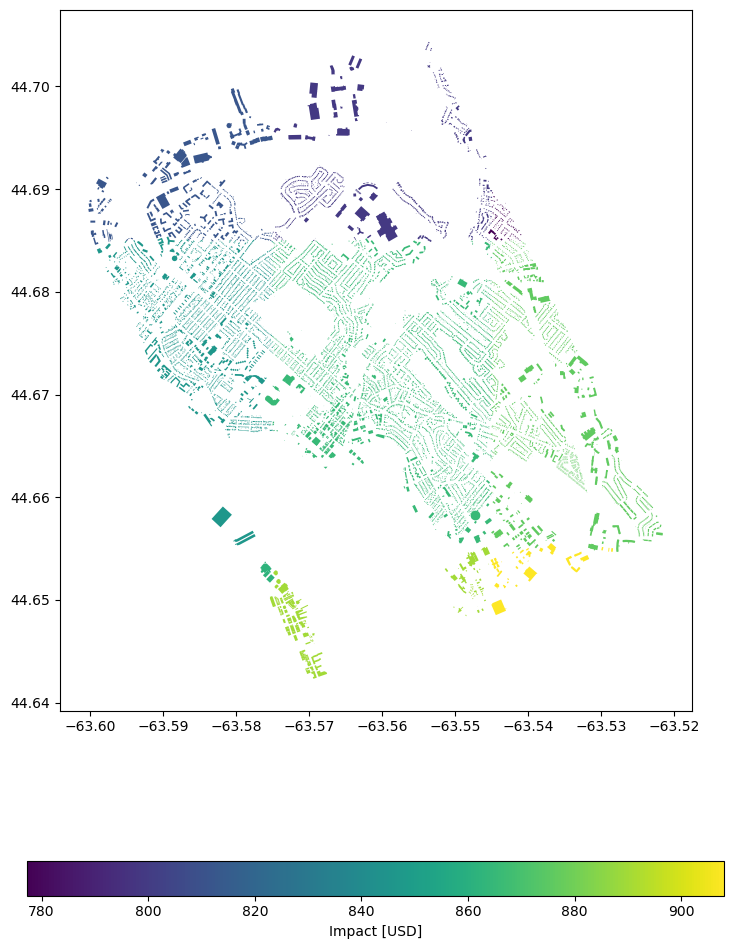

In [59]:
# Plot point-impacts and aggregated impacts
imp_pntgbay45.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay45);

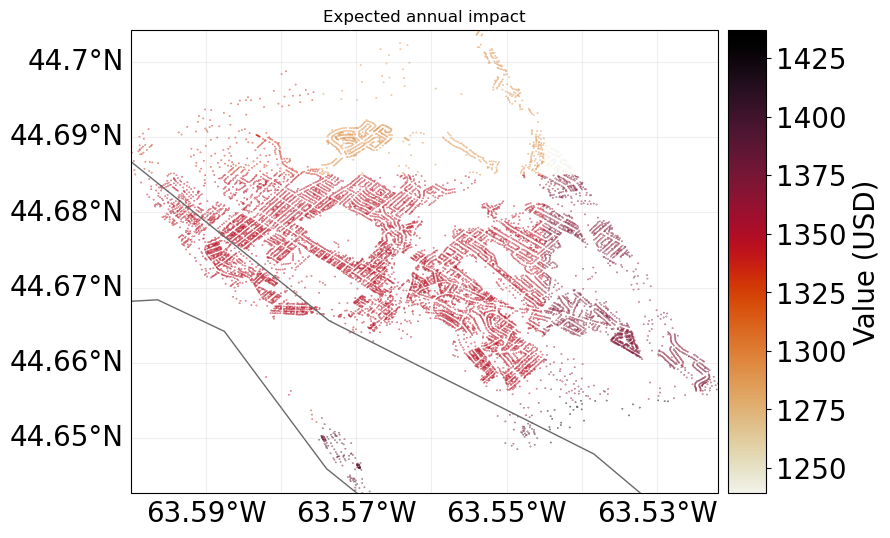

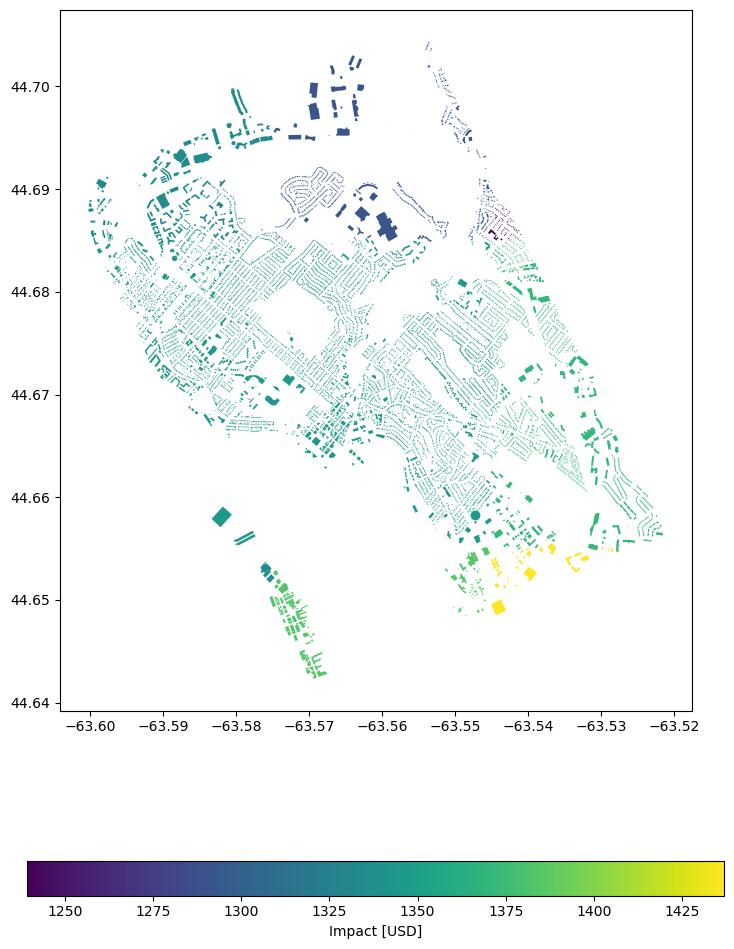

In [60]:
# Plot point-impacts and aggregated impacts
imp_pntgbay85.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay85);

In [204]:
imp_geomgbay85.write_excel('results/impt_pntgbay85_node.xlsx')
imp_geomgbay45.write_excel('results/impt_pntgbay45_node.xlsx')
imp_geomgbay.write_excel('results/impt_pntgbay_node.xlsx')

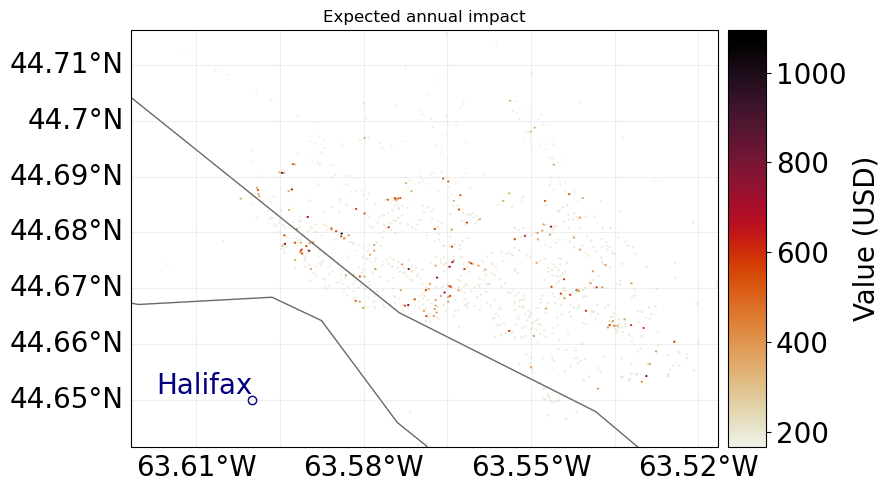

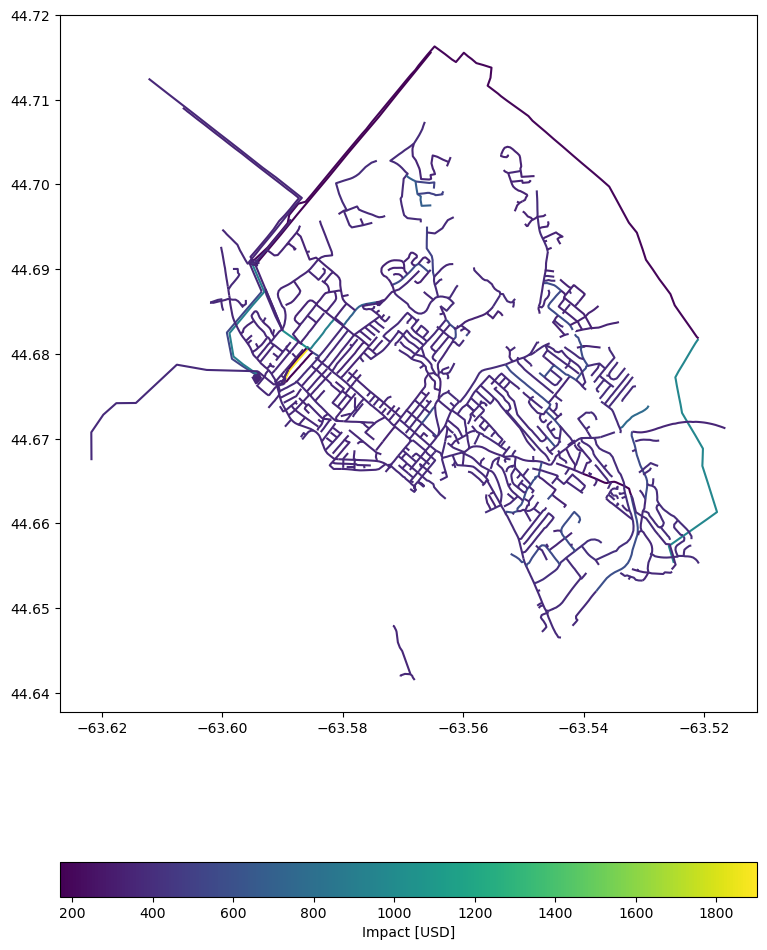

In [69]:
# Plot point-impacts and aggregated impacts
imp_pntgbay2.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay2);

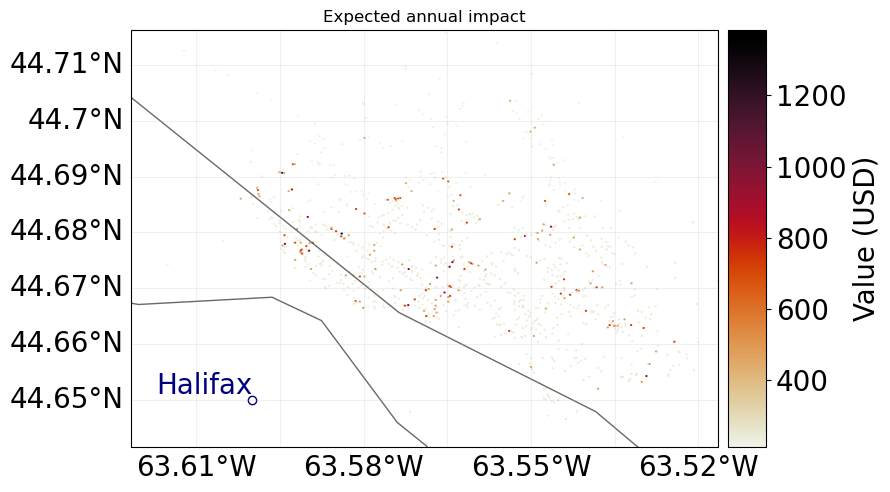

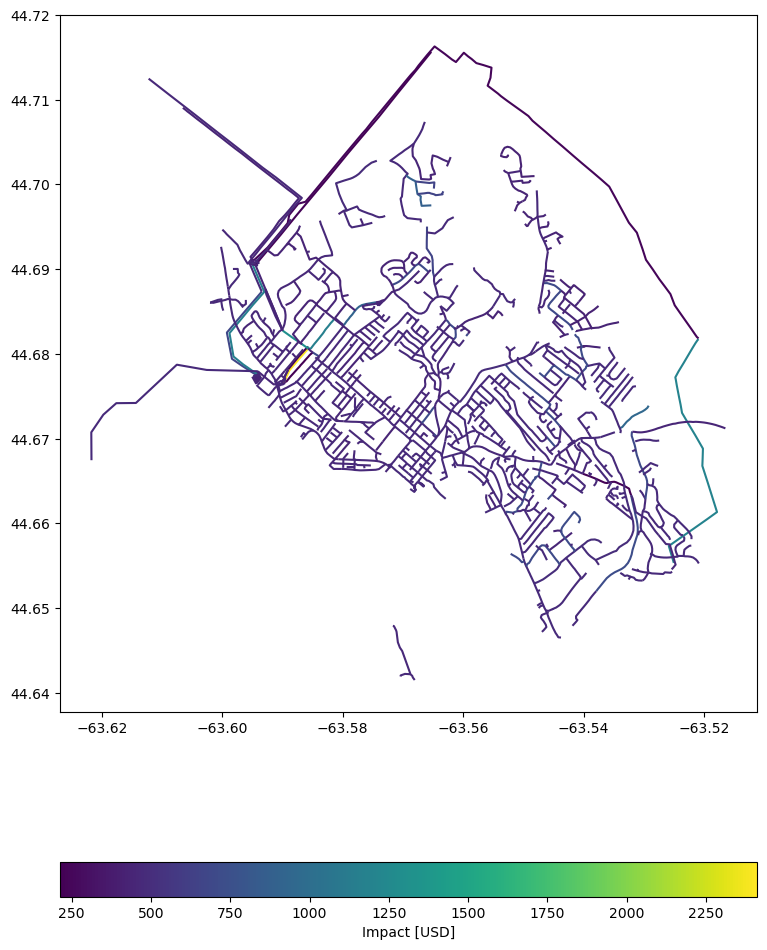

In [70]:
# Plot point-impacts and aggregated impacts
imp_pntgbay245.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay245);

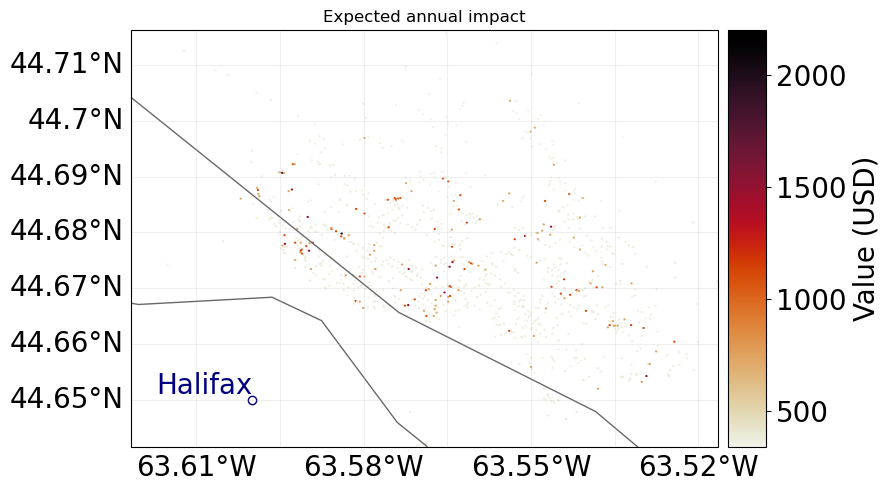

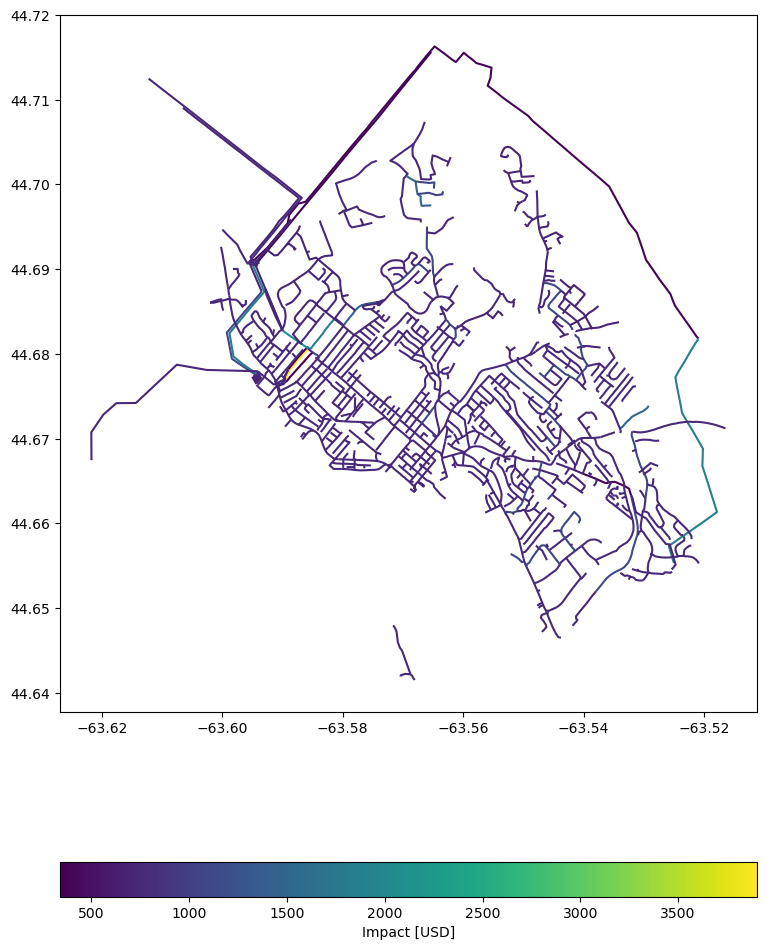

In [71]:
# Plot point-impacts and aggregated impacts
imp_pntgbay285.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay285);

In [233]:
imp_geomgbay285.write_excel('results/impt_pntgbay285_upgrade.xlsx')
imp_geomgbay245.write_excel('results/impt_pntgbay245_upgrade.xlsx')
imp_geomgbay2.write_excel('results/impt_pntgbay2_upgrade.xlsx')

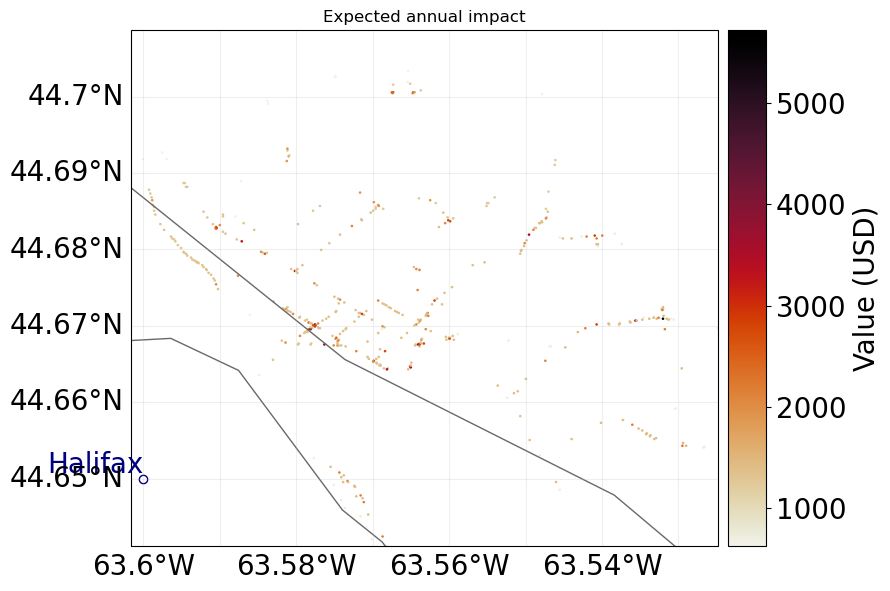

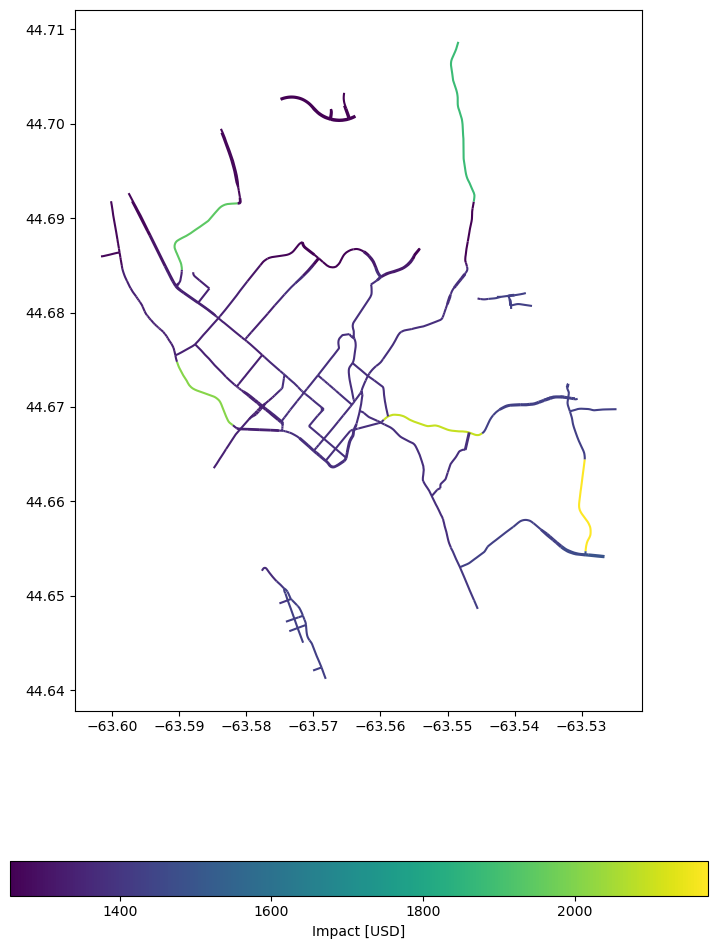

In [62]:
# Plot point-impacts and aggregated impacts
imp_pntgbay3.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay3);

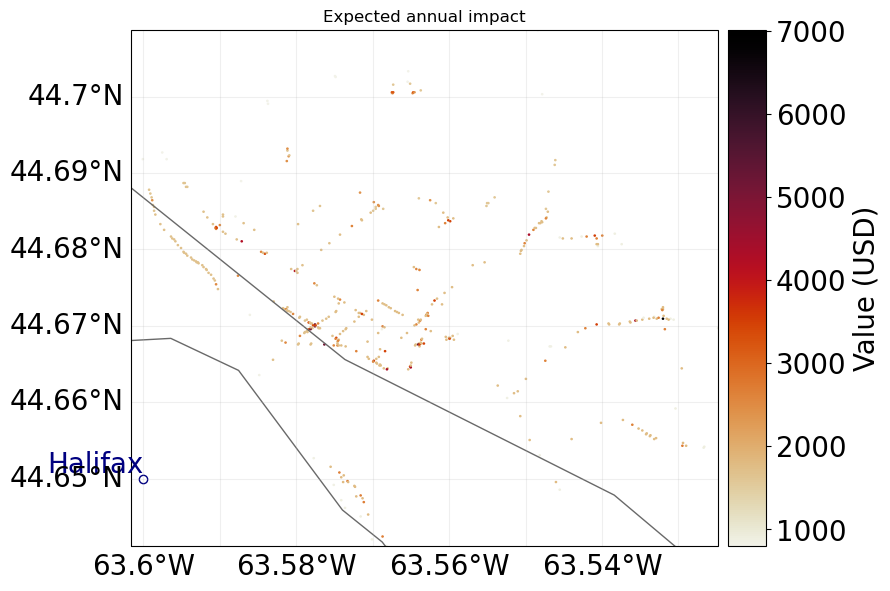

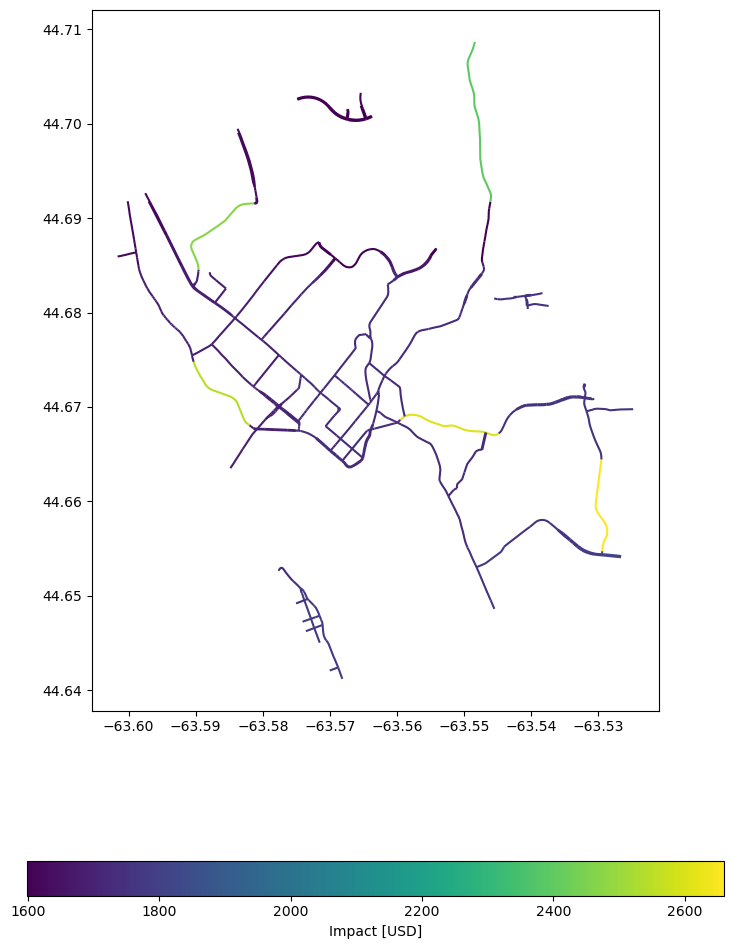

In [63]:
# Plot point-impacts and aggregated impacts
imp_pntgbay345.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay345);

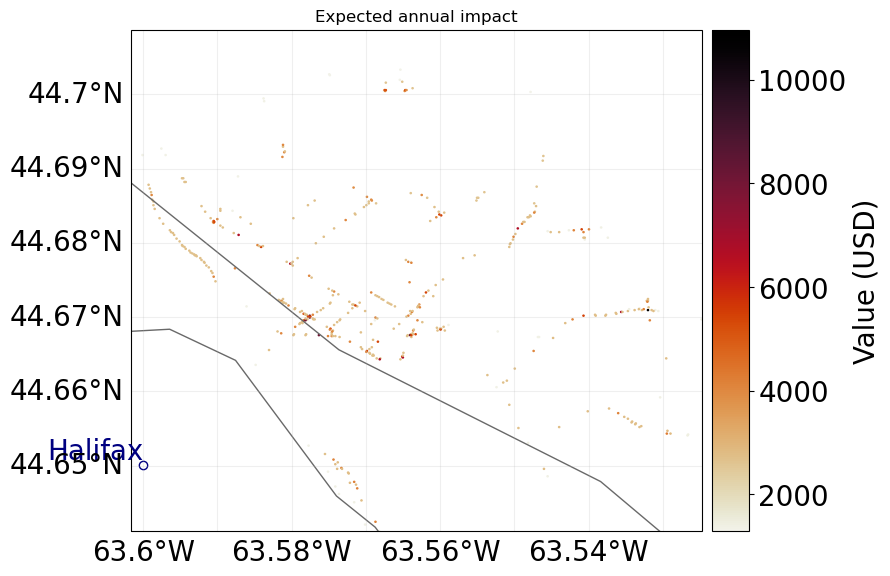

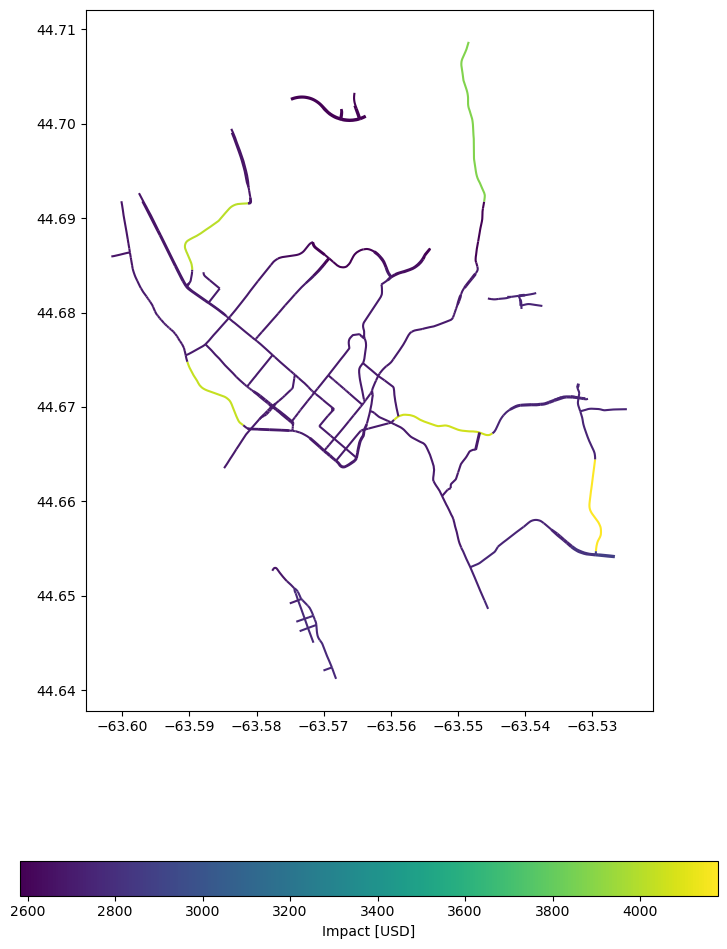

In [64]:
# Plot point-impacts and aggregated impacts
imp_pntgbay385.plot_hexbin_eai_exposure();
u_lp.plot_eai_exp_geom(imp_geomgbay385);

In [146]:
imp_geomgbay385.write_excel('results/impt_pntgbay385.xlsx')
imp_geomgbay345.write_excel('results/impt_pntgbay345.xlsx')
imp_geomgbay3.write_excel('results/impt_pnt3gbay.xlsx')

Expected average annual impact (houses TC): 7.610e+05 USD
Damage with 100-year return period: 4.617e+07 USD


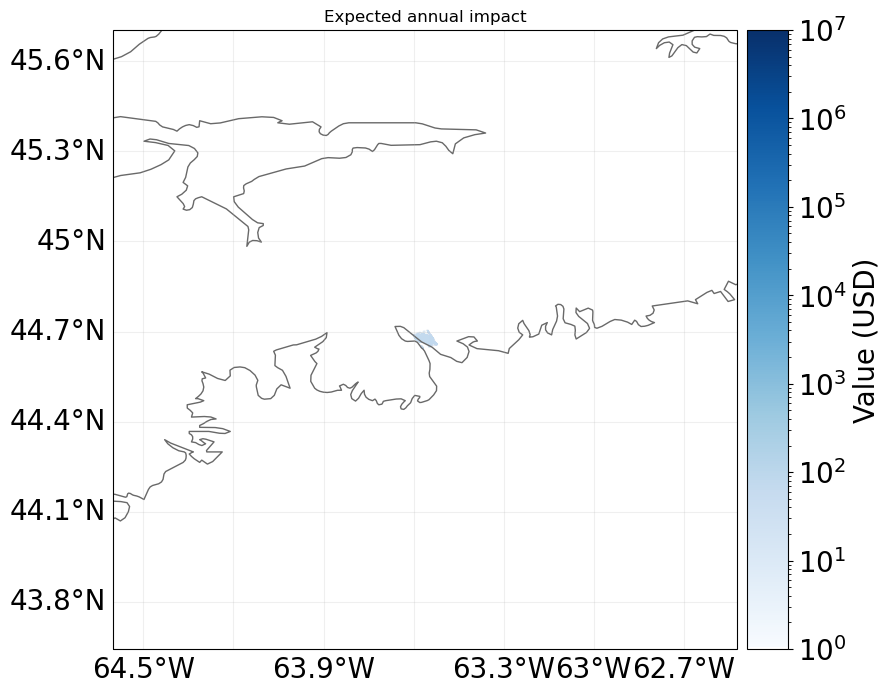

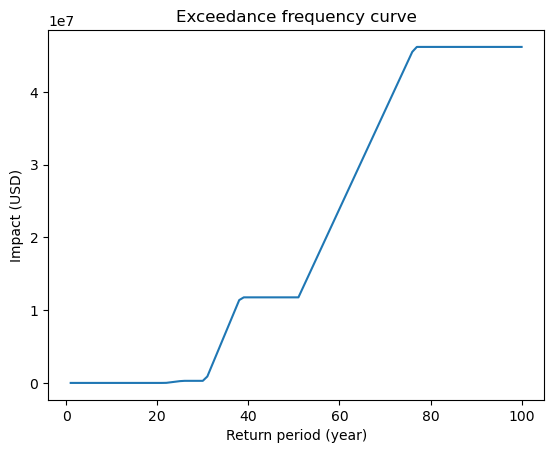

In [266]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_building_TC = imp_geomgbay.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_building_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 9.536e+05 USD
Damage with 100-year return period: 5.626e+07 USD


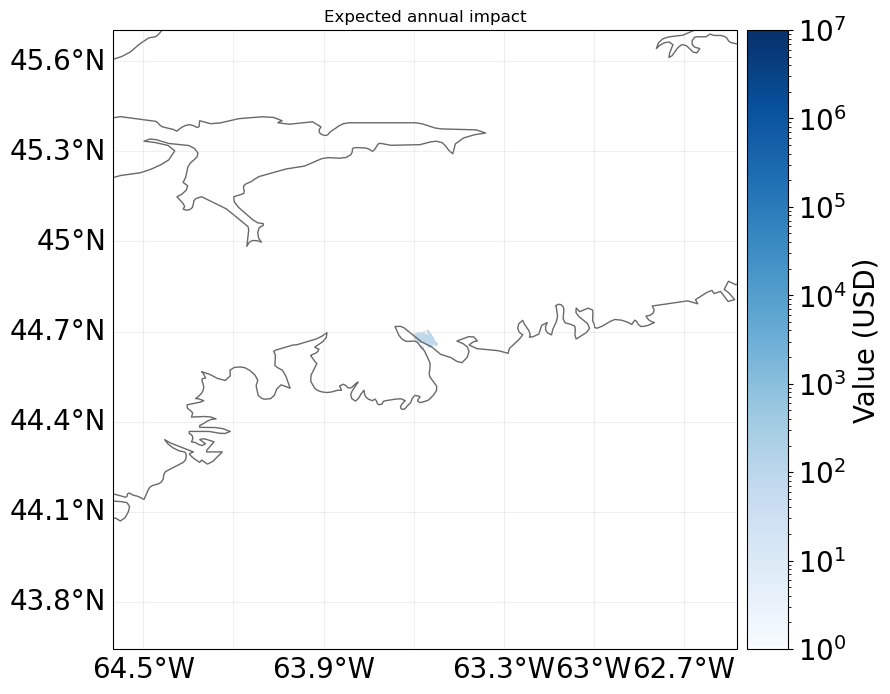

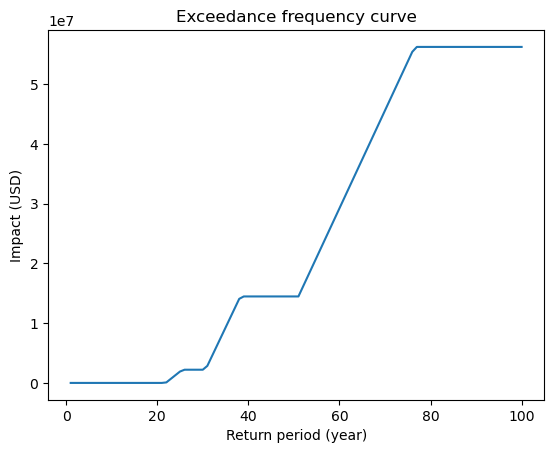

In [267]:
#Impact Map and Return Period Graph TC_45
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay45.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_building_TC_45 = imp_geomgbay45.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_building_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay45.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay45.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.499e+06 USD
Damage with 100-year return period: 8.315e+07 USD


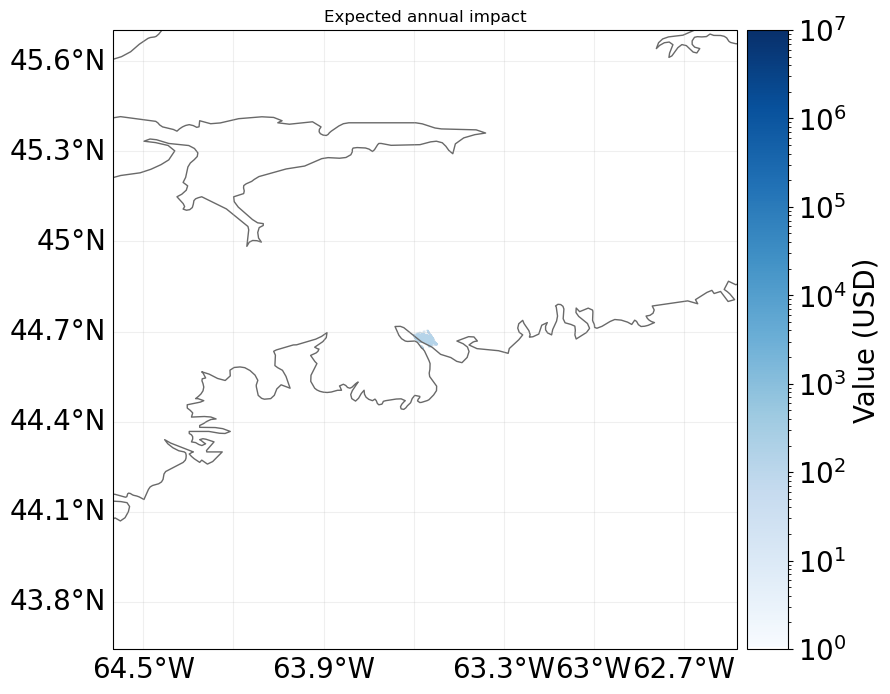

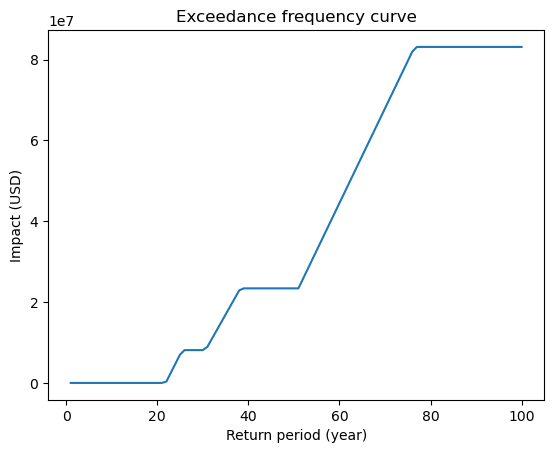

In [268]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay85.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_building_TC_85 = imp_geomgbay85.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_building_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay85.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay85.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 8.679e+04 USD
Damage with 100-year return period: 6.639e+06 USD


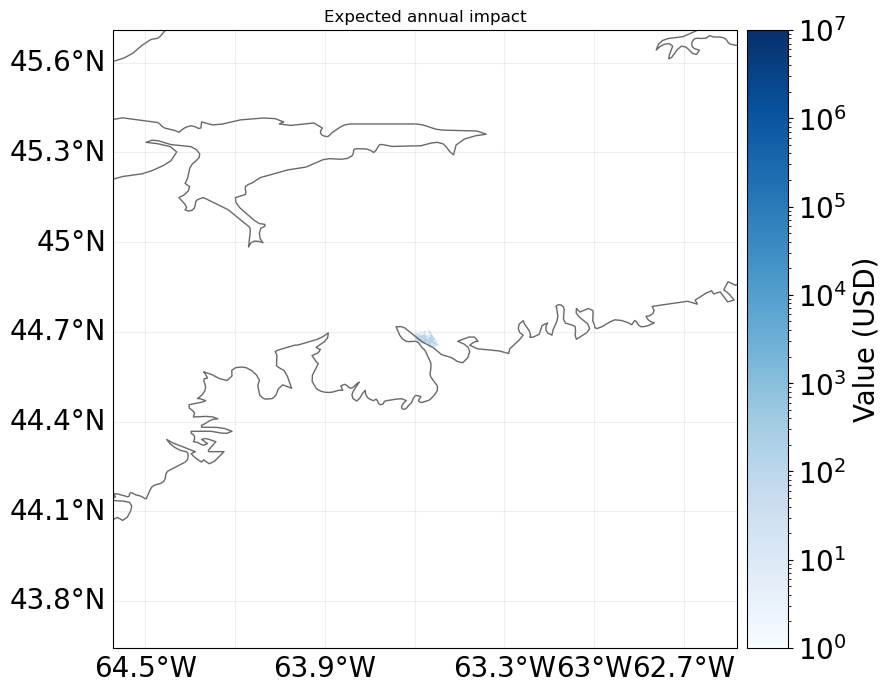

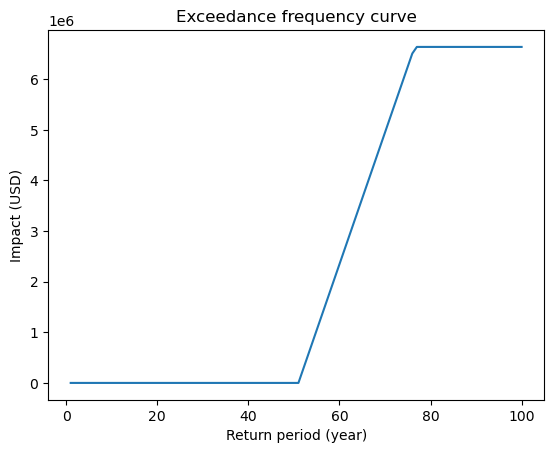

In [269]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay2.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_building_TC = imp_geomgbay2.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_building_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay2.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay2.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.216e+05 USD
Damage with 100-year return period: 9.305e+06 USD


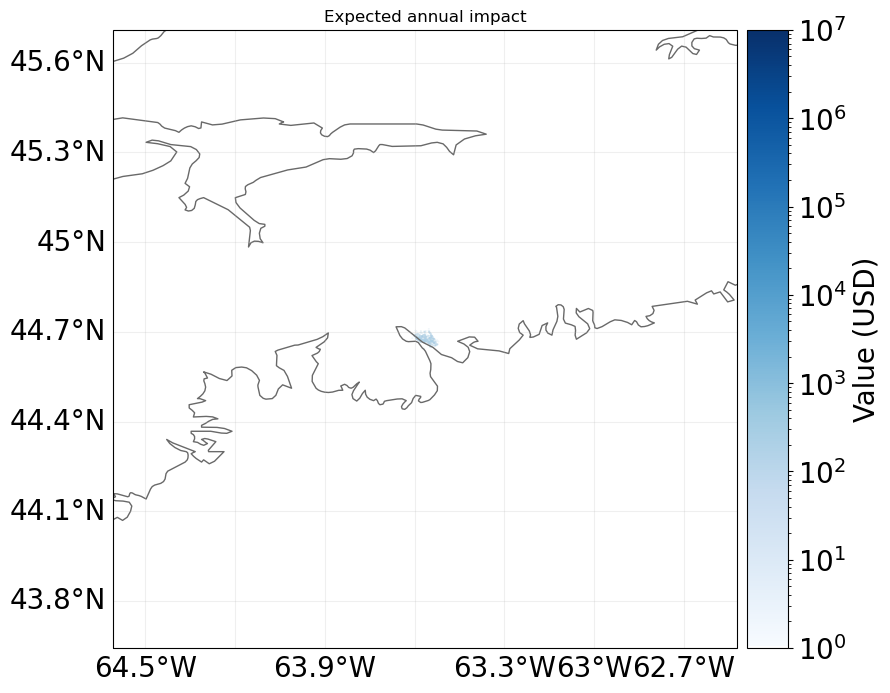

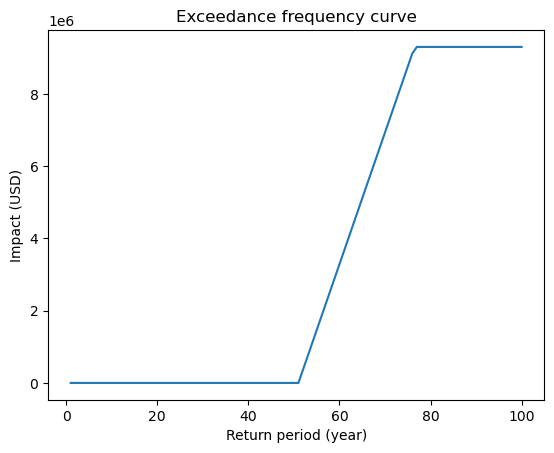

In [270]:
#Impact Map and Return Period Graph TC_45
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay245.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_voltage_TC_45 = imp_geomgbay245.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_voltage_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay245.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay245.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 2.227e+06 USD
Damage with 100-year return period: 1.620e+08 USD


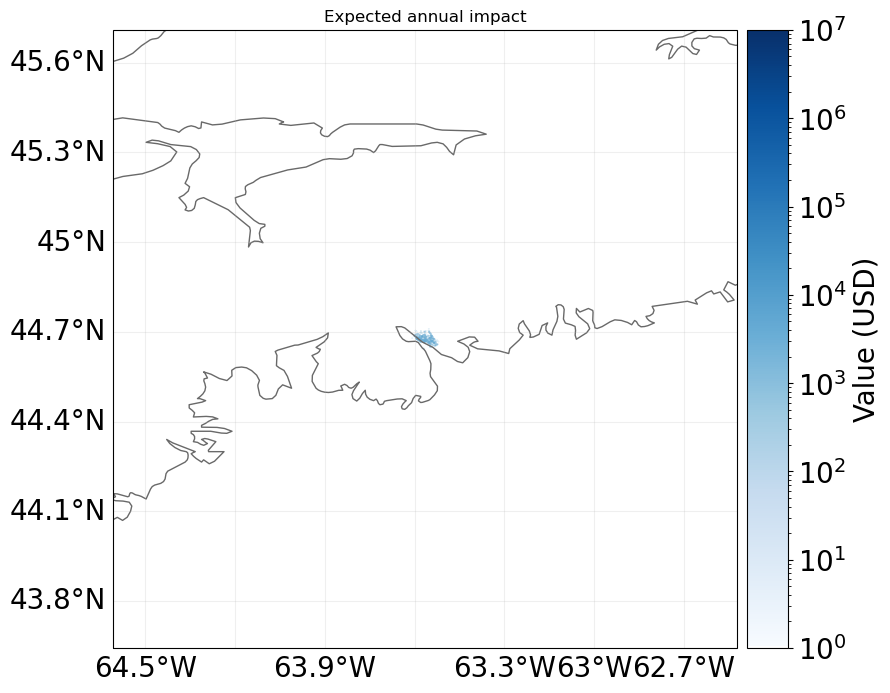

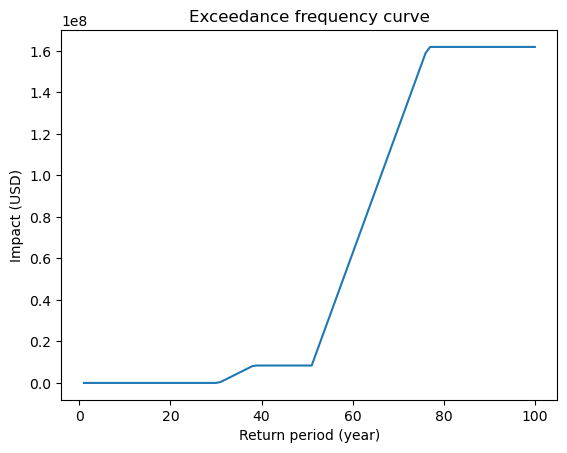

In [245]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay285.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_voltage_TC_85 = imp_geomgbay285.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_voltage_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay285.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay285.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 5.957e+04 USD
Damage with 100-year return period: 3.595e+06 USD


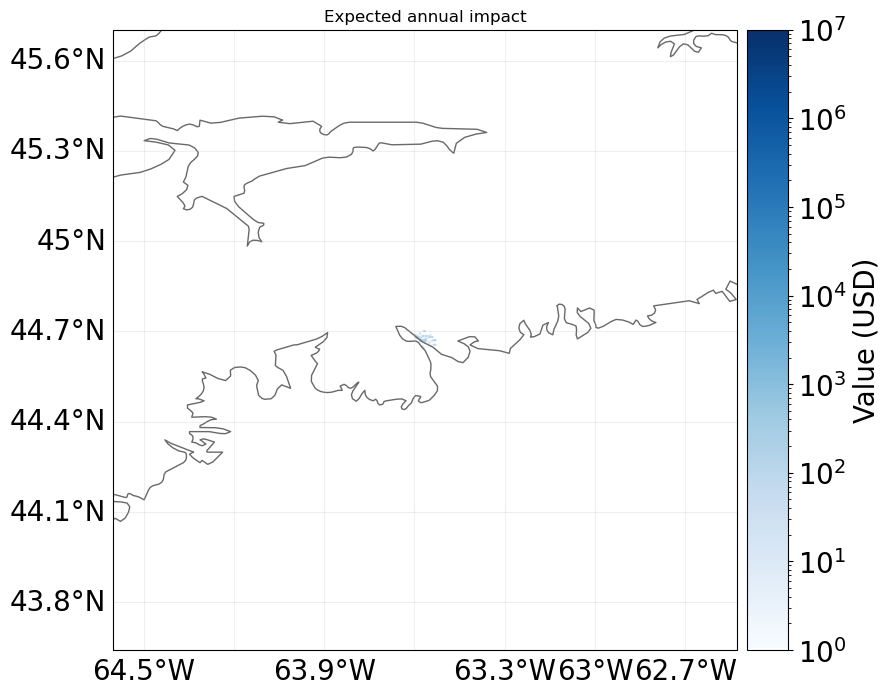

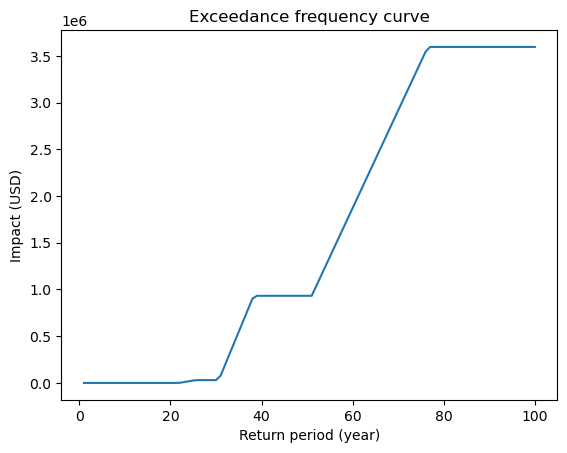

In [271]:
#Impact Map and Return Period Graph TC_0
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay3.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_road_TC = imp_geomgbay3.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_road_TC.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay3.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay3.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 7.474e+04 USD
Damage with 100-year return period: 4.386e+06 USD


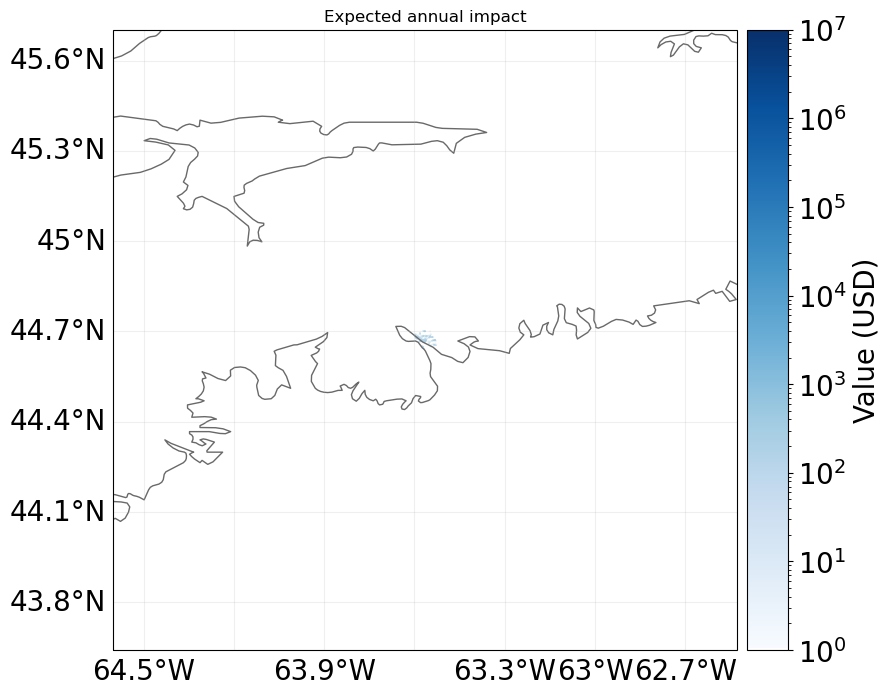

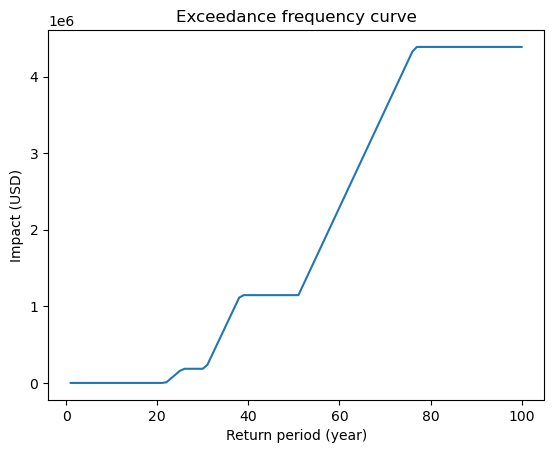

In [272]:
#Impact Map and Return Period Graph TC_45
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay345.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_road_TC_45 = imp_geomgbay345.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_road_TC_45.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay345.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay345.calc_freq_curve(100).impact))

Expected average annual impact (houses TC): 1.179e+06 USD
Damage with 100-year return period: 6.497e+07 USD


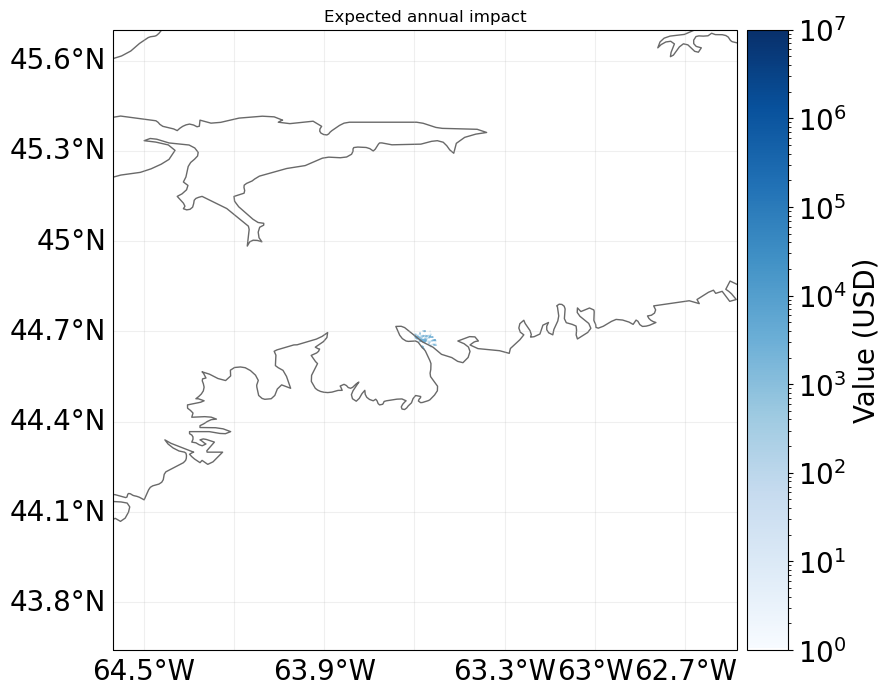

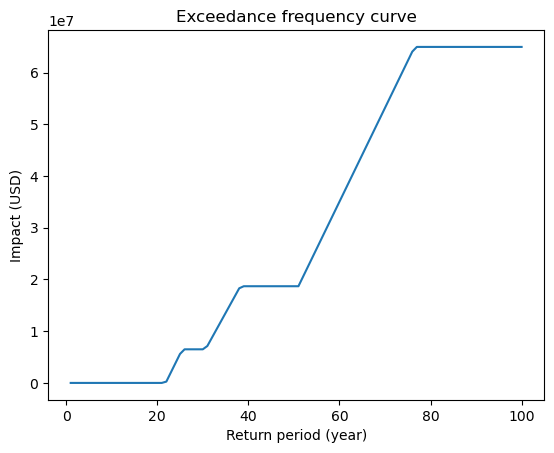

In [248]:
#Impact Map and Return Period Graph TC_85
#An example of plotting annual average loss map, exceedance frequency curves and reporting the damage of given return period.

norm = colors.LogNorm(vmin=1, vmax=1.0e7)
imp_geomgbay385.plot_hexbin_eai_exposure(pop_name=False, norm=norm, cmap=cmap, buffer=1, ignore_zero=True, adapt_fontsize=True)
freq_curve_road_TC_85 = imp_geomgbay385.calc_freq_curve(np.linspace(1, 100, 100))  # impact exceedence frequency curve
freq_curve_road_TC_85.plot()
print('Expected average annual impact (houses TC): {:.3e} USD'.format(imp_geomgbay385.aai_agg))
print('Damage with 100-year return period: {:.3e} USD'.format(imp_geomgbay385.calc_freq_curve(100).impact))

In [153]:
#Save Impact File GeoBN

import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
IMP_polygbay.write_tiff(results.joinpath('exp_buildinggbay.tiff'))

In [73]:
from datetime import datetime
from cartopy import crs as ccrs

from climada.util.config import CONFIG
from climada.engine.forecast import Forecast
from climada.hazard.storm_europe import StormEurope, generate_WS_forecast_hazard
from climada.entity.impact_funcs.storm_europe import ImpfStormEurope
from climada.entity import ImpactFuncSet
from climada.entity import LitPop

In [83]:
%matplotlib inline
# 1: tracks retrieval
from climada.hazard import TCTracks

tr_usax = TCTracks.from_ibtracs_netcdf(provider='usa', storm_id=['2003268N28298']) # CAN

2023-07-07 15:44:52,152 - climada.hazard.tc_tracks - WARNING - The cached IBTrACS data set dates from 2022-05-03 17:22:57 (older than 180 days). Very likely, a more recent version is available. Consider manually removing the file C:\Users\PLN\climada\data\IBTrACS.ALL.v04r00.nc and re-running this function, which will download the most recent version of the IBTrACS data set from the official URL.


In [84]:
# 2: wind gusts computation
from climada.hazard import TropCyclone, Centroids

# define centroids raster
min_lat, max_lat, min_lon, max_lon = 43.3, 47.1, -66.5, -59.5
cent_nsx = Centroids.from_pnt_bounds((min_lon, min_lat, max_lon, max_lat), res=0.03)
cent_nsx.set_dist_coast(signed=True, precomputed=True)
cent_nsx.check()

tc_nsx = TropCyclone.from_tracks(tr_usax, centroids=cent_nsx, ignore_distance_to_coast=False)

In [104]:
run_datetime=datetime(2022,7,10)
#create and calculate Forecast
CH_WS_forecast = Forecast({run_datetime: tc_nsx}, exp_house, IFs_TC_building)
CH_WS_forecast.calc()

In [37]:
#Simulate Hazard

#Define paths and file names

# Wind
fl_HAZ_tc = fl_HAZ_tc_cc0 # This path is defined in Configuration.py, indicating the wind hazard under current climate scenario. Please change the path there

fl_HAZ_tc_45 = os.path.join(project_folder, 'HAZ_tc_cc45_mix50_wof_' + country + file_identifier + '.hdf5')

fl_HAZ_tc_85 = os.path.join(project_folder, 'HAZ_tc_cc85_mix50_wof_' + country + file_identifier + '.hdf5')


# Surge
fl_HAZ_ts = os.path.join(project_folder, 'HAZ_ts_mix50_CDEM_' + country + file_identifier + '.hdf5')

fl_HAZ_ts_45 = os.path.join(project_folder, 'HAZ_ts_cc45_mix50_CDEM_' + country + file_identifier + '.hdf5')

fl_HAZ_ts_85 = os.path.join(project_folder, 'HAZ_ts_cc85_mix50_CDEM_' + country + file_identifier + '.hdf5')

2023-08-22 14:51:22,356 - climada.hazard.tc_tracks - WARNING - The cached IBTrACS data set dates from 2022-05-03 17:22:57 (older than 180 days). Very likely, a more recent version is available. Consider manually removing the file C:\Users\PLN\climada\data\IBTrACS.ALL.v04r00.nc and re-running this function, which will download the most recent version of the IBTrACS data set from the official URL.


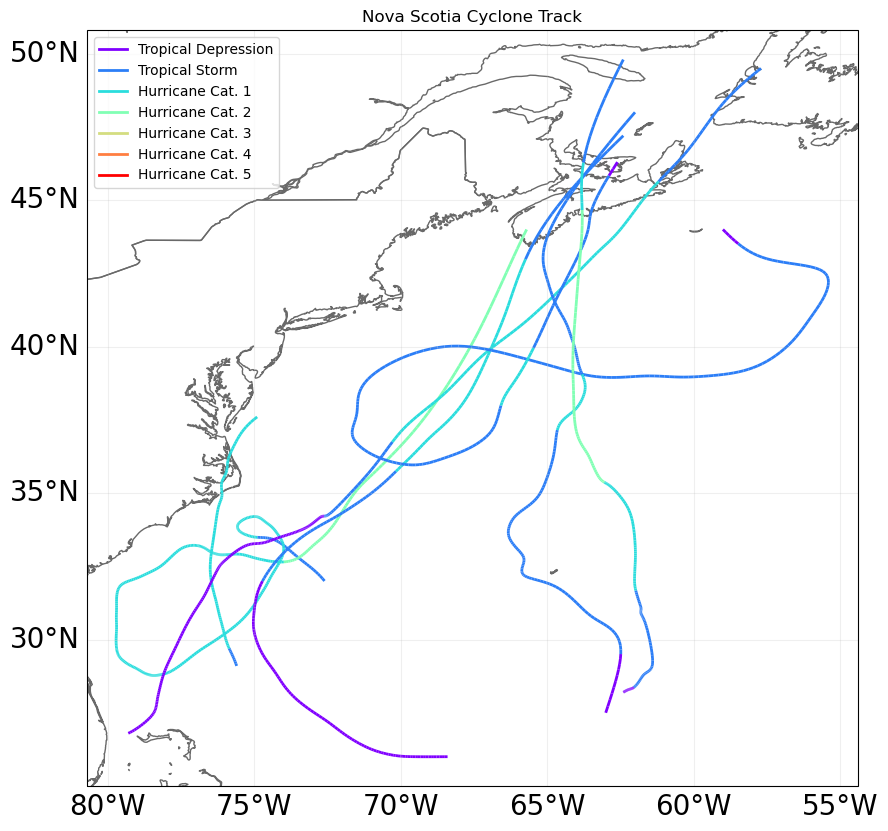

In [38]:
#Wind of tropical cyclones

%matplotlib inline
# 1: tracks retrieval
from climada.hazard import TCTracks

tr_usa = TCTracks.from_ibtracs_netcdf(provider='usa', storm_id=['2003268N28298', '1991302N44301', '2001284N28297', '1971223N27280', '1975205N26292', '1963291N26288', '1953223N23286']) # CAN  
tr_usa.equal_timestep(0.5)
ax = tr_usa.plot()
ax.get_legend()._loc = 2 # correct legend location
ax.set_title('Nova Scotia Cyclone Track'); # set title

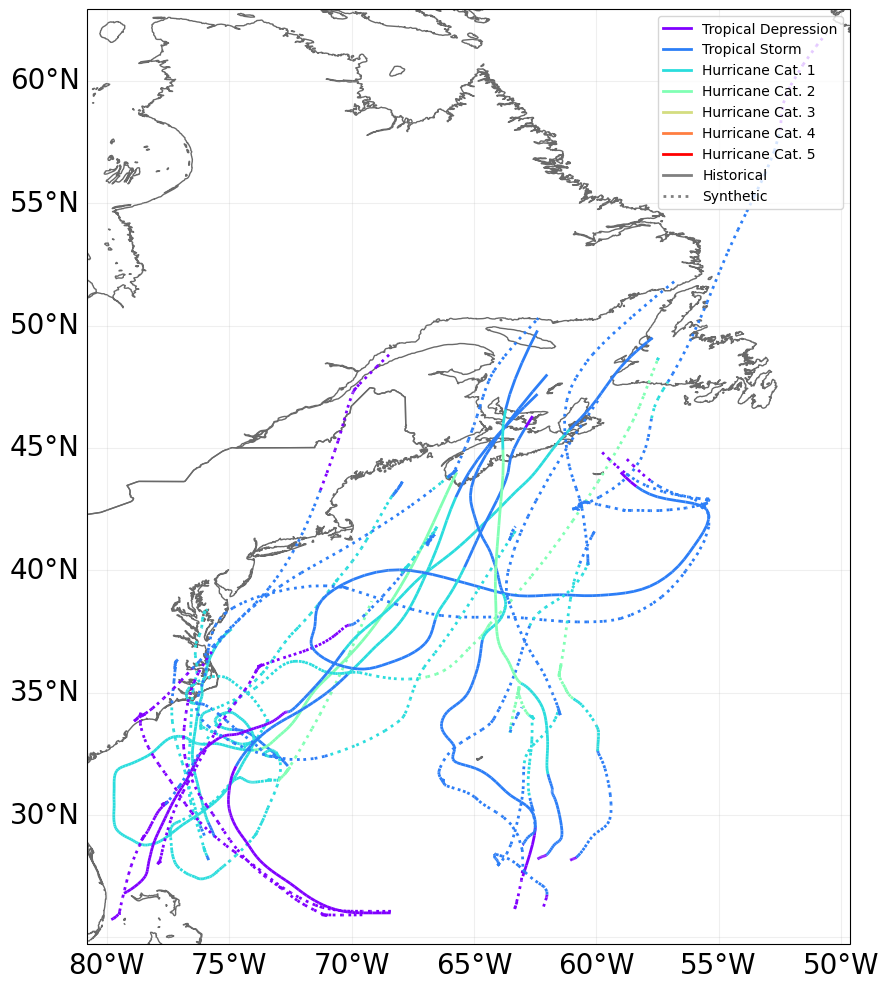

In [39]:
#Generate Probabilistic Events

# here we use tr_irma retrieved from IBTrACS with the function above
# select number of synthetic tracks (nb_synth_tracks) to generate per present tracks.
tr_usa.equal_timestep()
tr_usa.calc_perturbed_trajectories(nb_synth_tracks=2, max_shift_ini=1.5, max_dspeed_rel=1.5)
tr_usa.plot();
# see more configutration options (e.g. amplitude of max random starting point shift in decimal degree; max_shift_ini)

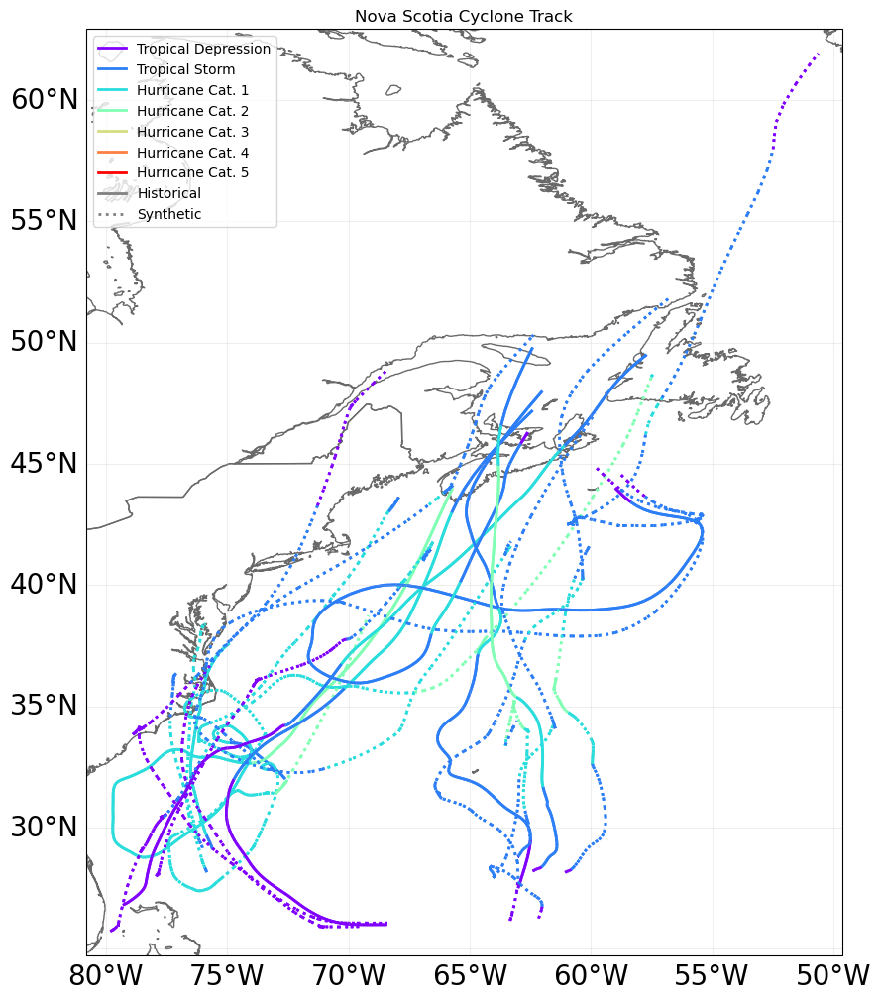

In [40]:
#tracks retrieval
from climada.hazard import TCTracks

tr_usa.append(tr_usa.data) # put both tracks together
ax = tr_usa.plot()
ax.get_legend()._loc = 2 # correct legend location
ax.set_title('Nova Scotia Cyclone Track'); # set title

In [41]:
# 2: wind gusts computation
from climada.hazard import TropCyclone, Centroids

# define centroids raster
min_lat, max_lat, min_lon, max_lon = 43.3, 47.1, -66.5, -59.5
cent_ns = Centroids.from_pnt_bounds((min_lon, min_lat, max_lon, max_lat), res=0.03)
cent_ns.set_dist_coast(signed=True, precomputed=True)
cent_ns.check()

tc_ns = TropCyclone.from_tracks(tr_usa, centroids=cent_ns, ignore_distance_to_coast=False)

In [23]:
# 3: surge computation
from climada_petals.hazard import TCSurgeBathtub
from climada.util.constants import DEMO_DIR

# If you have the global SRTM15+V2.0 elevation data set, you can replace the following
# sample DEM data set by your SRTM15+V2.0.tiff:
topo_path = DEMO_DIR.joinpath('SRTM15+V2.tif')
ts_ns = TCSurgeBathtub.from_tc_winds(tc_ns, topo_path)

<GeoAxesSubplot:>

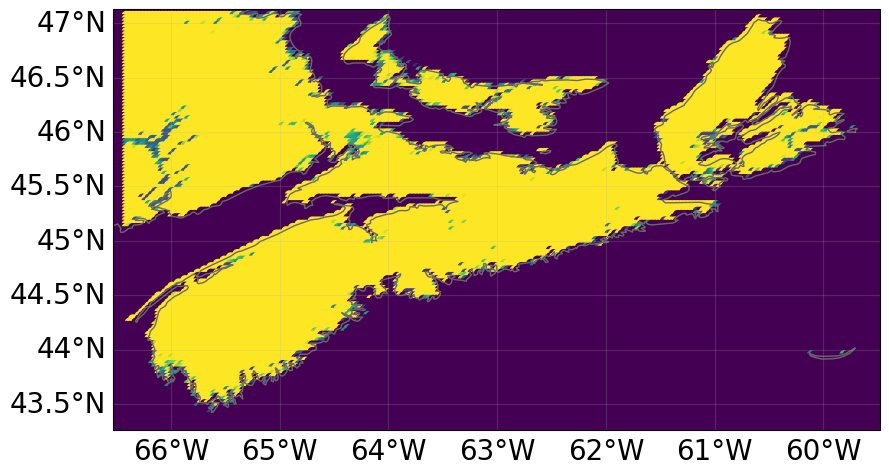

In [24]:
# plot elevation of the raster
ts_ns.centroids.set_elevation(topo_path)
ts_ns.centroids.plot(c=ts_ns.centroids.elevation, vmin=-2.0, vmax=10)

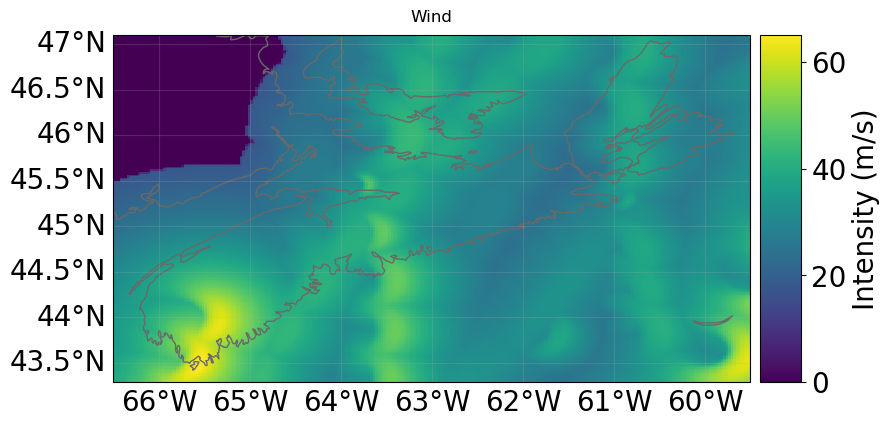

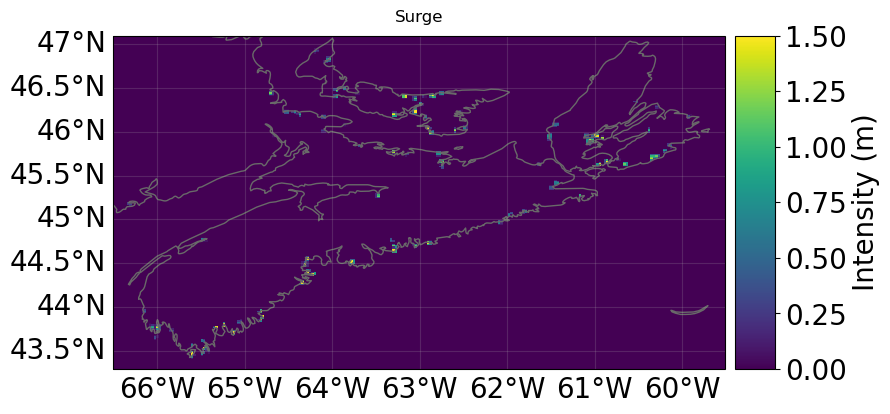

In [25]:
# plot wind and surge cyclone
norm = colors.LogNorm(vmin=1, vmax=5.0e7)

ax = tc_ns.plot_intensity(event=0, adapt_fontsize=True)
ax.set_title('Wind')
ax = ts_ns.plot_intensity(event=0, vmax=1.5, adapt_fontsize=True)
ax.set_title('Surge');

In [432]:
tr_usa.data[-1] # last synthetic track. notice the value of orig_event_flag and name

<xarray.Dataset>
Dimensions:                 (time: 121)
Coordinates:
  * time                    (time) datetime64[ns] 2003-09-24T12:00:00 ... 200...
    lon                     (time) float64 -62.05 -62.01 -61.98 ... -60.6 -60.2
    lat                     (time) float64 27.81 27.83 27.85 ... 48.29 48.94
Data variables:
    time_step               (time) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    radius_max_wind         (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    radius_oci              (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    max_sustained_wind      (time) float64 25.0 25.67 26.33 ... 63.57 60.24 56.9
    central_pressure        (time) float64 1.009e+03 1.009e+03 ... 991.3 993.6
    environmental_pressure  (time) float64 1.012e+03 1.012e+03 ... 1.005e+03
    basin                   (time) <U2 'NA' 'NA' 'NA' 'NA' ... 'NA' 'NA' 'NA'
    on_land                 (time) bool False False False ... False False False
    dist_since_lf           (time) float64 nan nan nan nan ... nan nan nan nan
Attributes:
    max_sustained_wind_unit:  kn
    central_pressure_unit:    mb
    name:                     JUAN_gen2
    sid:                      2003268N28298_gen2
    orig_event_flag:          False
    data_provider:            ibtracs_usa
    id_no:                    2003268028298.02
    category:                 2

In [289]:
# This functionality is part of climada_petals, uncomment to execute
from climada_petals.hazard import TCForecast

tc_fcast = TCForecast()
tc_fcast.fetch_ecmwf()

print(tc_fcast.data[0])

2022-11-05 15:54:34,279 - climada_petals.hazard.tc_tracks_forecast - INFO - Fetching BUFR tracks:


Processing: 100%|██████████████████████████████████████████████████████████████████| 42/42 [00:08<00:00,  4.96 files/s]

<xarray.Dataset>
Dimensions:                 (time: 10)
Coordinates:
  * time                    (time) datetime64[ns] 2022-10-25T12:00:00 ... 202...
    lat                     (time) float64 -15.3 -15.5 -15.6 ... -16.1 -15.9
    lon                     (time) float64 -176.7 -177.8 ... -174.4 -174.6
Data variables:
    max_sustained_wind      (time) float64 13.9 14.9 13.4 ... 14.4 17.0 13.9
    central_pressure        (time) float64 1.007e+03 1.006e+03 ... 1.006e+03
    time_step               (time) int32 180 6 6 6 6 6 6 6 6 6
    radius_max_wind         (time) float64 nan nan nan nan ... nan nan nan nan
    environmental_pressure  (time) float64 1.01e+03 1.01e+03 ... 1.01e+03
    basin                   (time) <U2 'P' 'P' 'P' 'P' 'P' 'P' 'P' 'P' 'P' 'P'
Attributes:
    max_sustained_wind_unit:  m/s
    central_pressure_unit:    mb
    name:                     73P
    sid:                      73P
    orig_event_flag:          False
    data_provider:            ECMWF
    id_no:    

2023-07-07 12:35:01,550 - climada.hazard.base - WARNING - Exceedance intenstiy values below 0 are set to 0.                    Reason: no negative intensity values were found in hazard.


(array([[<GeoAxesSubplot:title={'center':'Return period: 10 years'}>,
         <GeoAxesSubplot:title={'center':'Return period: 25 years'}>],
        [<GeoAxesSubplot:title={'center':'Return period: 50 years'}>,
         <GeoAxesSubplot:title={'center':'Return period: 100 years'}>]],
       dtype=object),
 array([[ 0.        ,  0.        ,  0.        , ...,  6.9452625 ,
          7.27881381,  7.63978791],
        [ 0.        ,  0.        ,  0.        , ..., 24.76042556,
         24.73575487, 24.70904112],
        [ 0.        ,  0.        ,  0.        , ..., 38.23707617,
         37.94142099, 37.6214327 ],
        [ 0.        ,  0.        ,  0.        , ..., 51.71372678,
         51.14708711, 50.53382429]]))

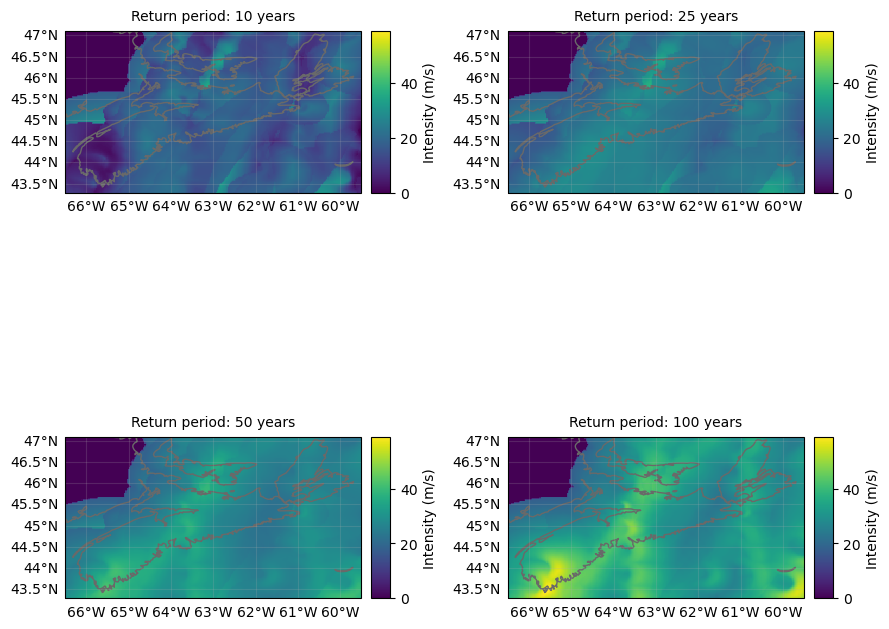

In [20]:
tc_ns.plot_rp_intensity(return_periods = [10, 25, 50, 100])

In [ ]:
ts_ns.plot_rp_intensity(return_periods = [10, 25, 50, 100])

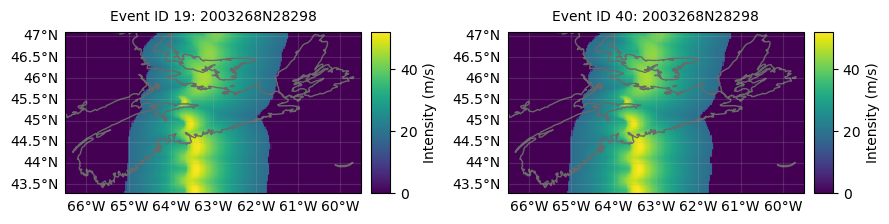

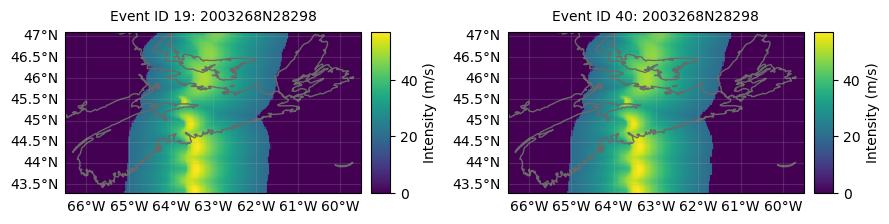

In [42]:
#Implementing Climate Change Cyclone

# an event-like in 2055 under RCP 4.5:
tc_usa = TropCyclone.from_tracks(tr_usa, centroids=cent_ns)
HAZ_tc_cc45 = tc_usa.apply_climate_scenario_knu(ref_year=2055, rcp_scenario=45)
HAZ_tc_cc45.plot_intensity('2003268N28298');

# an event-like in 2055 under RCP 8.5:
tc_usa = TropCyclone.from_tracks(tr_usa, centroids=cent_ns)
HAZ_tc_cc85 = tc_usa.apply_climate_scenario_knu(ref_year=2100, rcp_scenario=85)
HAZ_tc_cc85.plot_intensity('2003268N28298');


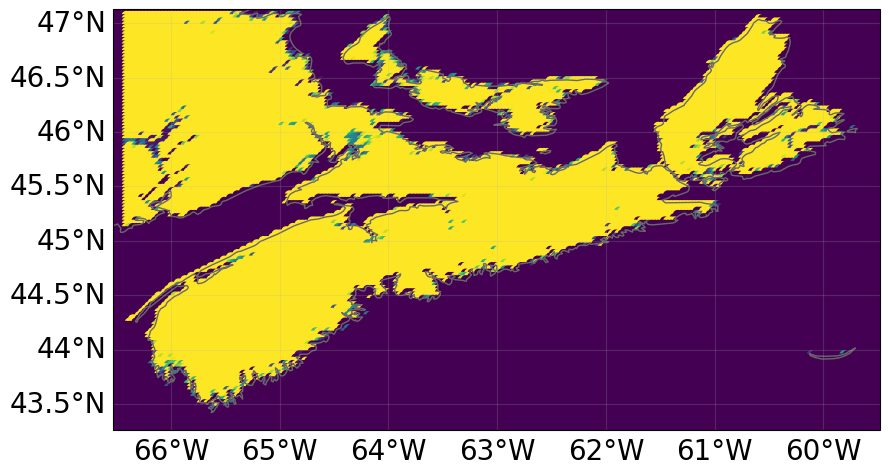

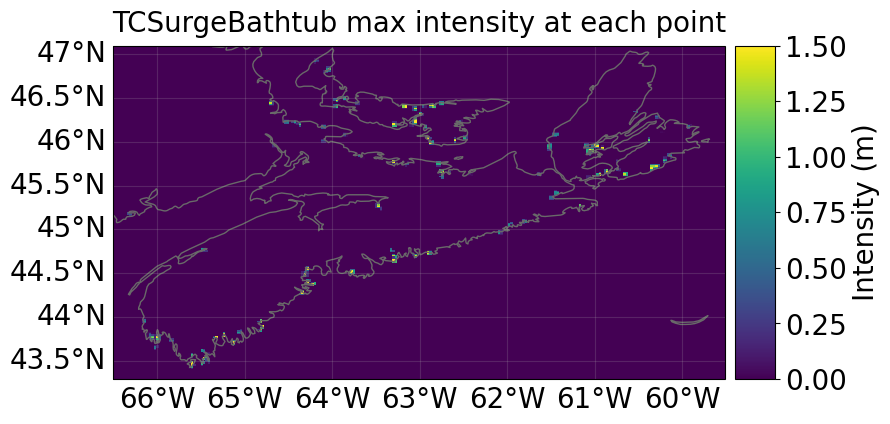

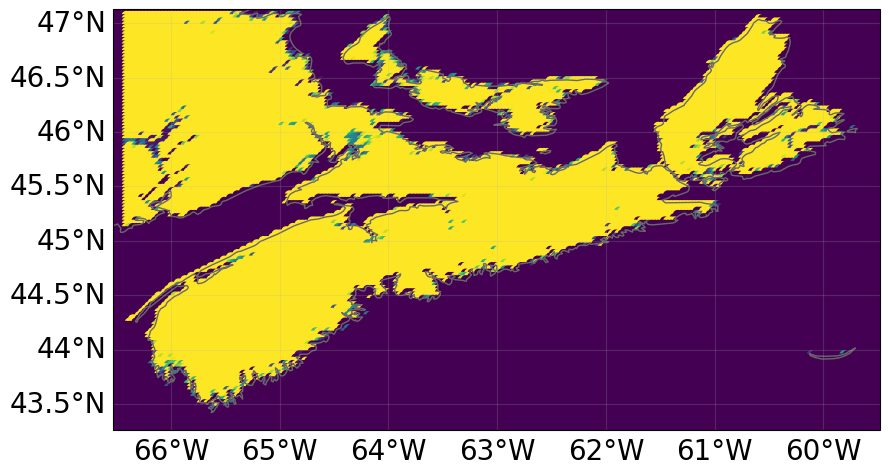

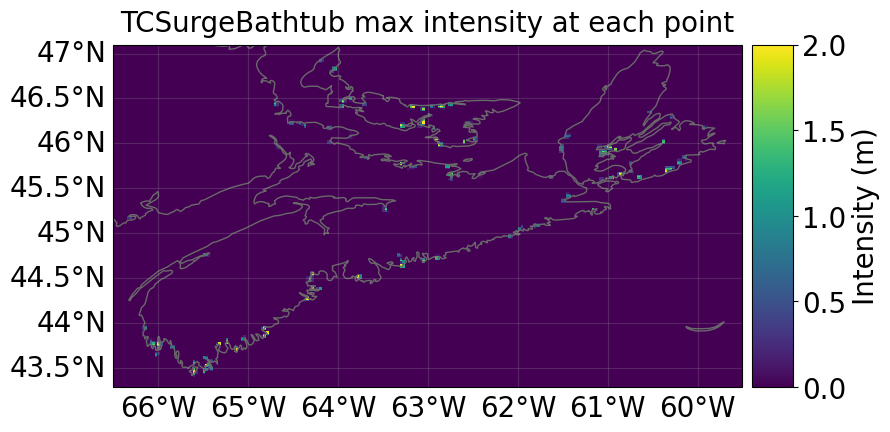

In [27]:
#Implementing Climate Change Surge

norm = colors.LogNorm(vmin=0.5, vmax=50)

# an event-like in 2055 under RCP 4.5:
HAZ_ts_cc45 = TCSurgeBathtub.from_tc_winds(HAZ_tc_cc45, topo_path, inland_decay_rate=0.2, add_sea_level_rise=0.2)
# plot elevation of the raster
HAZ_ts_cc45.centroids.set_elevation(topo_path)
HAZ_ts_cc45.centroids.plot(c=ts_ns.centroids.elevation, vmin=1, vmax=10)
HAZ_ts_cc45.plot_intensity(event=0, vmax=1.5);

# an event-like in 2100 under RCP 8.5:
HAZ_ts_cc85 = TCSurgeBathtub.from_tc_winds(HAZ_tc_cc85, topo_path, inland_decay_rate=0.3, add_sea_level_rise=0.3)
# plot elevation of the raster
HAZ_ts_cc85.centroids.set_elevation(topo_path)
HAZ_ts_cc85.centroids.plot(c=ts_ns.centroids.elevation, vmin=1, vmax=10)
HAZ_ts_cc85.plot_intensity(event=0, vmax=2.0);


In [43]:
#Create Impact Function
#Wind Impact Function

import numpy as np
from matplotlib import colors
from Configuration import *
import os

from climada.entity import IFTropCyclone, ImpactFuncSet, ImpactFunc

In [44]:
# Impact function building

IFs_TC_building = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TC'
if_tc.id = 1
if_tc.intensity_unit = 'm/s'
if_tc.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 70, 80])
if_tc.mdd = np.array([0, 0, 0, 0, 0.05, 0.20, 0.45, 0.65, 0.78])
if_tc.paa = np.ones(9)
if_tc.check()

IFs_TC_building.append(if_tc)


# Impact function wind-people

IFs_TC_people = ImpactFuncSet()

if_tc_people = IFTropCyclone()
if_tc_people.haz_type = 'TC'
if_tc_people.id = 1
if_tc_people.intensity_unit = 'm/s'

if_tc_people.intensity = np.arange(0, 100, 0.5)
if_tc_people.paa = np.ones(if_tc_people.intensity.size)
if_tc_people.mdd = np.zeros(if_tc_people.intensity.size)
for idx in range(if_tc_people.mdd.size):
    if if_tc_people.intensity[idx] >= storm_threshold:
        if_tc_people.mdd[idx] = 1

if_tc_people.check()

IFs_TC_people.append(if_tc_people)

In [186]:
# Impact function surge-road

IFs_TC_road = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TS'
if_tc.id = 1
if_tc.intensity_unit = 'm'
if_tc.intensity = np.array([0, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 5.25, 5.5, 5.75, 6])
if_tc.mdd = np.array([0, 0.02, 0.08, 0.1, 0.13, 0.15, 0.2, 0.3, 0.55, 0.63, 0.75, 0.8, 0.88, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
if_tc.paa = np.ones(25)
if_tc.check()

IFs_TC_road.append(if_tc)

In [53]:
# Impact function surge-MV line

IFs_TC_voltage = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TS'
if_tc.id = 1
if_tc.intensity_unit = 'm'
if_tc.intensity = np.array([0, 1, 2, 3, 4, 5, 6])
if_tc.mdd = np.array([0, 0, 0, 0, 0, 0, 0])
if_tc.paa = np.ones(7)
if_tc.check()

IFs_TC_voltage.append(if_tc)

C:\Users\PLN\AppData\Local\Temp\ipykernel_15256\800560229.py:5: DeprecatedWarning: IFTropCyclone is deprecated. The class name IFTropCyclone is deprecated and won't be supported in a future version. Use ImpfTropCyclone instead
  if_tc = IFTropCyclone()


In [54]:
# Impact function wind-MV line

IFs_TC_voltage2 = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TC'
if_tc.id = 1
if_tc.intensity_unit = 'm/s'
if_tc.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 70, 80])
if_tc.mdd = np.array([0, 0, 0, 0, 0, 0.35, 0.7, 1, 1])
if_tc.paa = np.ones(9)
if_tc.check()

IFs_TC_voltage2.append(if_tc)

C:\Users\PLN\AppData\Local\Temp\ipykernel_15256\4253821113.py:5: DeprecatedWarning: IFTropCyclone is deprecated. The class name IFTropCyclone is deprecated and won't be supported in a future version. Use ImpfTropCyclone instead
  if_tc = IFTropCyclone()


In [55]:
# Impact function wind-road

IFs_TC_roadwind = ImpactFuncSet()

if_tc = IFTropCyclone()
if_tc.haz_type = 'TC'
if_tc.id = 1
if_tc.intensity_unit = 'm/s'
if_tc.intensity = np.array([0, 10, 20, 30, 40, 50, 60, 70, 80])
if_tc.mdd = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0])
if_tc.paa = np.ones(9)
if_tc.check()

IFs_TC_roadwind.append(if_tc)

C:\Users\PLN\AppData\Local\Temp\ipykernel_15256\4272071482.py:5: DeprecatedWarning: IFTropCyclone is deprecated. The class name IFTropCyclone is deprecated and won't be supported in a future version. Use ImpfTropCyclone instead
  if_tc = IFTropCyclone()


<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

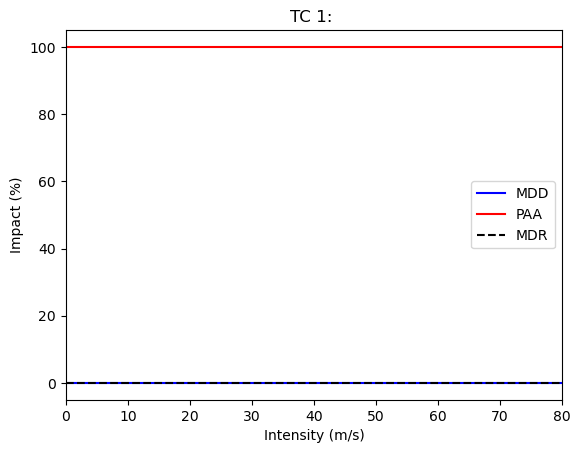

In [203]:
IFs_TC_roadwind.plot()

<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

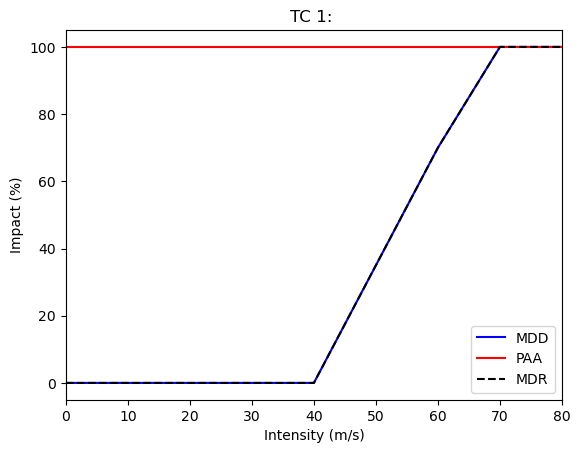

In [201]:
IFs_TC_voltage2.plot()

<AxesSubplot:title={'center':'TS 1: '}, xlabel='Intensity (m)', ylabel='Impact (%)'>

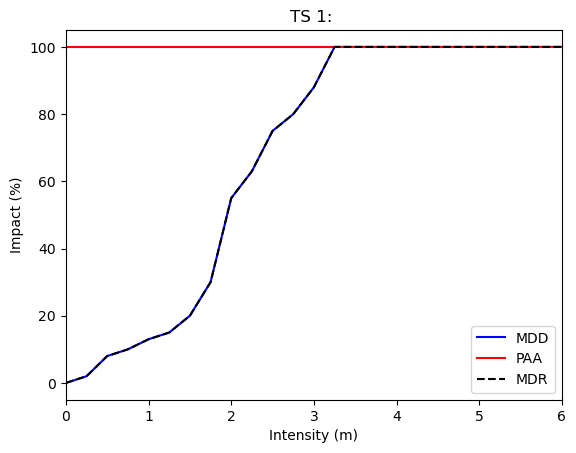

In [187]:
IFs_TC_road.plot()

<AxesSubplot:title={'center':'TS 1: '}, xlabel='Intensity (m)', ylabel='Impact (%)'>

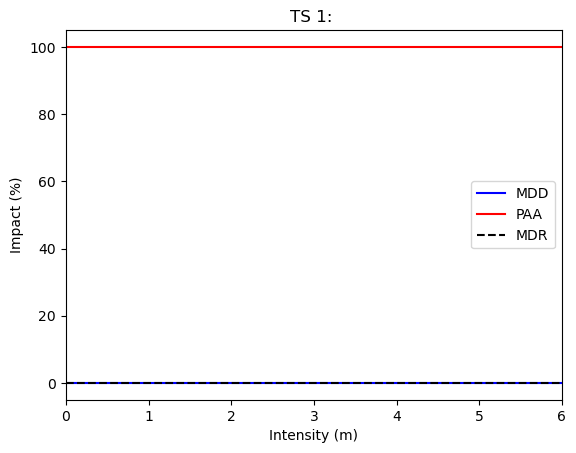

In [191]:
IFs_TC_voltage.plot()

<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

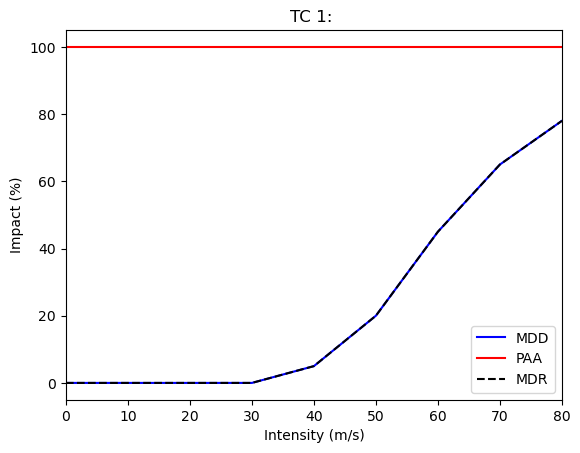

In [42]:
IFs_TC_building.plot()

In [33]:
# Exposures: rename column and assign id
exp_house.gdf.rename(columns={"impf_": "impf_" + haz_type}, inplace=True)
exp_house.gdf['impf_' + haz_type] = haz_id
exp_house.check()
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_TC
1485,24.316869,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1
1486,24.316867,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1
1487,24.316867,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1
1488,24.316867,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1
2282,24.320664,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1


In [34]:
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_TC
1485,24.316869,POINT (-60.60417 47.02917),47.029167,-60.604167,124,1
1486,24.316867,POINT (-60.59583 47.02917),47.029167,-60.595833,124,1
1487,24.316867,POINT (-60.58750 47.02917),47.029167,-60.587500,124,1
1488,24.316867,POINT (-60.57917 47.02917),47.029167,-60.579167,124,1
2282,24.320664,POINT (-60.61250 47.02083),47.020833,-60.612500,124,1


<AxesSubplot:title={'center':'TC 1: '}, xlabel='Intensity (m/s)', ylabel='Impact (%)'>

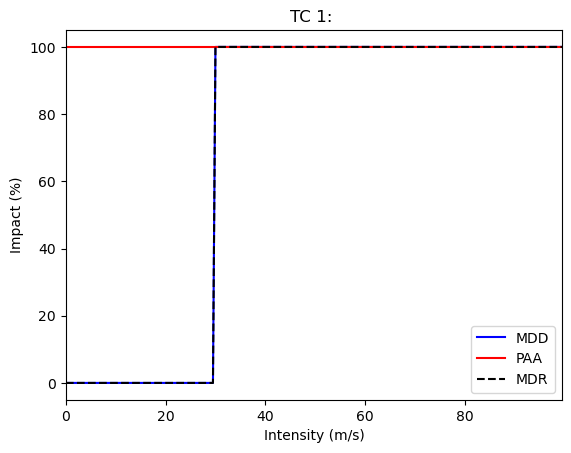

In [43]:
IFs_TC_people.plot()

In [3]:
#Surge Impact Function
import numpy as np
from matplotlib import colors
from Configuration import *
import os

from climada.entity import IFTropCyclone, ImpactFuncSet, ImpactFunc
from climada.entity import ImpactFuncSet, ImpfTropCyclone

# Impact function
IFs_TS_building = ImpactFuncSet()

if_ts = ImpactFunc()
if_ts.id = 2
if_ts.haz_type = 'TS'
if_ts.intensity_unit = 'm'
if_ts.intensity = np.array([0, 0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0, 6.0])
if_ts.mdd = np.array([0, 0.33, 0.49, 0.62, 0.72, 0.87, 0.93, 0.98, 1.0])
if_ts.paa = np.ones(9)
if_ts.check()

IFs_TS_building.append(if_ts)

In [30]:
if_ts.check()

In [61]:
# Get the hazard type and hazard id
[haz_type] = IFs_TS_building.get_hazard_types()
[haz_id] = IFs_TS_building.get_ids()[haz_type]
print(f"hazard type: {haz_type}, hazard id: {haz_id}")

hazard type: TS, hazard id: 2


In [62]:
# Exposures: rename column and assign id
exp_house.gdf.rename(columns={"impf_": "impf_"}, inplace=True)
exp_house.gdf['impf_'] = haz_id
exp_house.check()
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_,centr_TCSurgeBathtub
1485,22.595200,POINT (-60.60417 47.02917),47.029167,-60.604167,124,2,665
1486,22.595199,POINT (-60.59583 47.02917),47.029167,-60.595833,124,2,665
1487,22.595199,POINT (-60.58750 47.02917),47.029167,-60.587500,124,2,665
1488,22.595199,POINT (-60.57917 47.02917),47.029167,-60.579167,124,2,665
2282,22.598727,POINT (-60.61250 47.02083),47.020833,-60.612500,124,2,898


In [63]:
exp_house.gdf.head()

,value,geometry,latitude,longitude,region_id,impf_,centr_TCSurgeBathtub
1485,22.595200,POINT (-60.60417 47.02917),47.029167,-60.604167,124,2,665
1486,22.595199,POINT (-60.59583 47.02917),47.029167,-60.595833,124,2,665
1487,22.595199,POINT (-60.58750 47.02917),47.029167,-60.587500,124,2,665
1488,22.595199,POINT (-60.57917 47.02917),47.029167,-60.579167,124,2,665
2282,22.598727,POINT (-60.61250 47.02083),47.020833,-60.612500,124,2,898


In [32]:
##Calculate Impact

from climada.engine import Impact

In [ ]:
# building
IMP_building_TC = Impact()
IMP_building_TC.calc(exp_house, IFs_TC_building, tc_ns)

IMP_building_TC_45 = Impact()
IMP_building_TC_45.calc(exp_house, IFs_TC_building, HAZ_tc_cc45)

IMP_building_TC_85 = Impact()
IMP_building_TC_85.calc(exp_house, IFs_TC_building, HAZ_tc_cc85)

In [ ]:
#Save Building Impact File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
IMP_building_TC.write_tiff(results.joinpath('imp_building.tiff'))
IMP_building_TC45.write_tiff(results.joinpath('imp_building45.tiff'))
IMP_building_TC85.write_tiff(results.joinpath('imp_building85.tiff'))

In [ ]:
#Save MV electrical lines Impact File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
IMP_voltage_TC.write_tiff(results.joinpath('imp_voltage.tiff'))
IMP_voltage_TC45.write_tiff(results.joinpath('imp_voltage45.tiff'))
IMP_voltage_TC85.write_tiff(results.joinpath('imp_voltage85.tiff'))

In [ ]:
#Save roads Impact File
import fiona; fiona.supported_drivers
from climada import CONFIG
results = CONFIG.local_data.save_dir.dir()

# write as hdf5 file
IMP_road_TC.write_tiff(results.joinpath('imp_road.tiff'))
IMP_road_TC45.write_tiff(results.joinpath('imp_road45.tiff'))
IMP_road_TC85.write_tiff(results.joinpath('imp_road85.tiff'))